In [17]:
from __future__ import print_function
import argparse
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
import matplotlib.pyplot as plt

In [2]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 20, 5, 1)
        self.conv2 = nn.Conv2d(20, 50, 5, 1)
        self.fc1 = nn.Linear(4 * 4 * 50, 500)
        self.fc2 = nn.Linear(500, 10)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2, 2)
        x = x.view(-1, 4 * 4 * 50)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return F.log_softmax(x, dim=1)



In [14]:
from torch.optim import Optimizer
import math

class Adam(Optimizer):


    def __init__(self, params, lr=1e-3, betas=(0.9, 0.999), eps=1e-8,
                 weight_decay=0, amsgrad=False):
        if not 0.0 <= lr:
            raise ValueError("Invalid learning rate: {}".format(lr))
        if not 0.0 <= eps:
            raise ValueError("Invalid epsilon value: {}".format(eps))
        if not 0.0 <= betas[0] < 1.0:
            raise ValueError("Invalid beta parameter at index 0: {}".format(betas[0]))
        if not 0.0 <= betas[1] < 1.0:
            raise ValueError("Invalid beta parameter at index 1: {}".format(betas[1]))
        if not 0.0 <= weight_decay:
            raise ValueError("Invalid weight_decay value: {}".format(weight_decay))
        defaults = dict(lr=lr, betas=betas, eps=eps,
                        weight_decay=weight_decay, amsgrad=amsgrad)
        super(Adam, self).__init__(params, defaults)

    def __setstate__(self, state):
        super(Adam, self).__setstate__(state)
        for group in self.param_groups:
            group.setdefault('amsgrad', False)

    @torch.no_grad()
    def step(self, closure=None):
        """Performs a single optimization step.

        Arguments:
            closure (callable, optional): A closure that reevaluates the model
                and returns the loss.
        """
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad
                if grad.is_sparse:
                    raise RuntimeError('Adam does not support sparse gradients, please consider SparseAdam instead')
                amsgrad = group['amsgrad']

                state = self.state[p]

                # State initialization
                if len(state) == 0:
                    state['step'] = 0
                    # Exponential moving average of gradient values
                    state['exp_avg'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    # Exponential moving average of squared gradient values
                    state['exp_avg_sq'] = torch.zeros_like(p, memory_format=torch.preserve_format)
                    if amsgrad:
                        # Maintains max of all exp. moving avg. of sq. grad. values
                        state['max_exp_avg_sq'] = torch.zeros_like(p, memory_format=torch.preserve_format)

                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                if amsgrad:
                    max_exp_avg_sq = state['max_exp_avg_sq']
                beta1, beta2 = group['betas']

                state['step'] += 1
                bias_correction1 = 1 - beta1 ** state['step']
                bias_correction2 = 1 - beta2 ** state['step']

                if group['weight_decay'] != 0:
                    grad = grad.add(p, alpha=group['weight_decay'])


                # Decay the first and second moment running average coefficient
                exp_avg.mul_(beta1).add_(grad, alpha=1 - beta1)
                exp_avg_sq.mul_(beta2).addcmul_(grad, grad, value=1 - beta2)
                if amsgrad:
                    # Maintains the maximum of all 2nd moment running avg. till now
                    torch.max(max_exp_avg_sq, exp_avg_sq, out=max_exp_avg_sq)
                    # Use the max. for normalizing running avg. of gradient
                    denom = (max_exp_avg_sq.sqrt() / math.sqrt(bias_correction2)).add_(group['eps'])
                else:
                    denom = (exp_avg_sq.sqrt() / math.sqrt(bias_correction2)).add_(group['eps'])

                step_size = group['lr'] / bias_correction1

                p.addcdiv_(exp_avg, denom, value=-step_size)


                update = (exp_avg / denom).view(-1)
                if update.shape[0] > 200:
                  plt.hist(update.cpu())
                  plt.show()
                  plt.close()
                ###### Zhiyi THIS 'update' is the random variable we care about!

        return loss

In [15]:

def train(args, model, device, train_loader, optimizer, epoch):
    model.train()
    

    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output, target)
        loss.backward()
        optimizer.step()
        if batch_idx % args.log_interval == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                       100. * batch_idx / len(train_loader), loss.item()))

def test(args, model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))




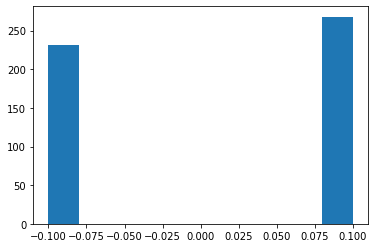

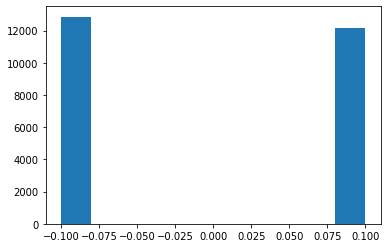

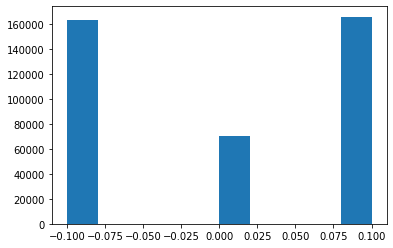

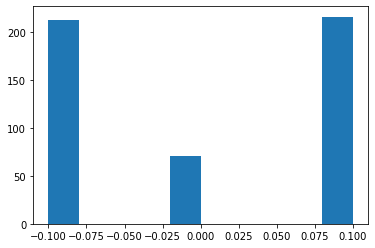

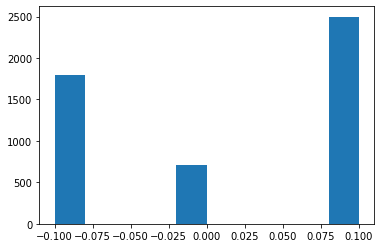

Train Epoch: 0 [0/60000 (0%)]	Loss: 2.300039


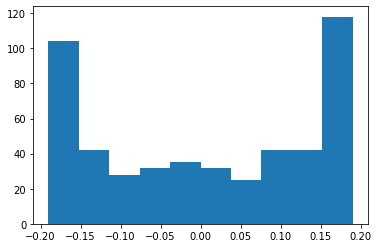

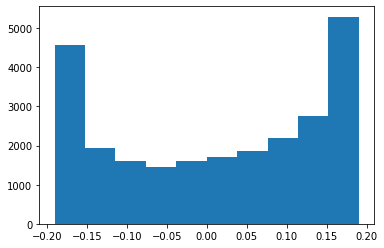

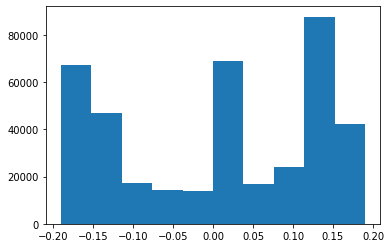

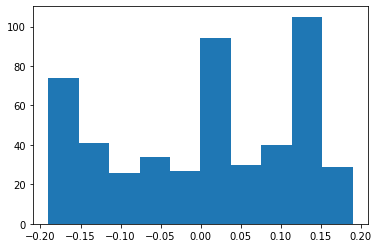

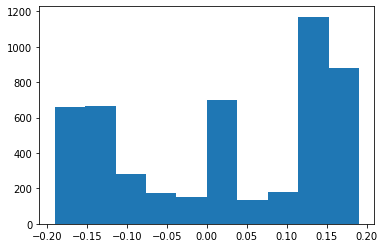

...

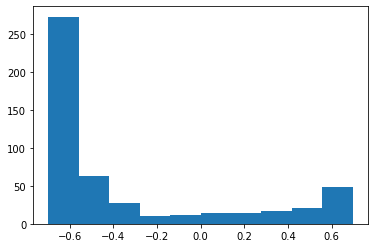

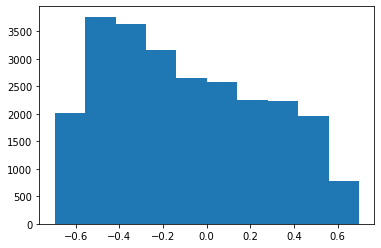

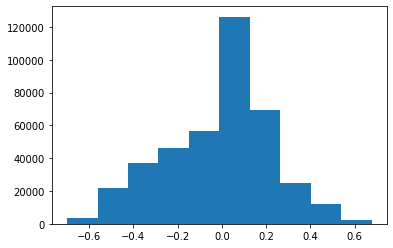

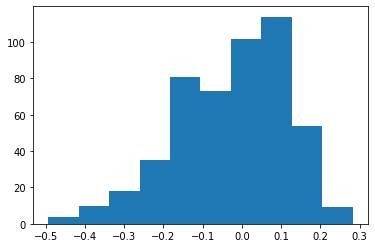

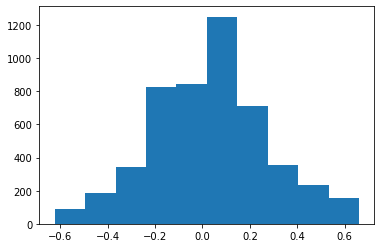

Train Epoch: 0 [640/60000 (1%)]	Loss: 0.960062


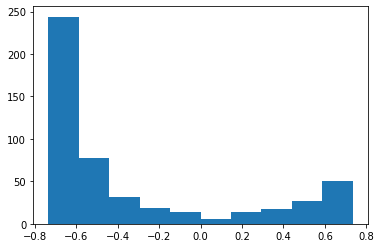

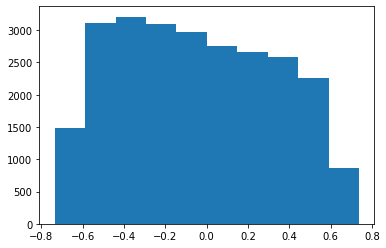

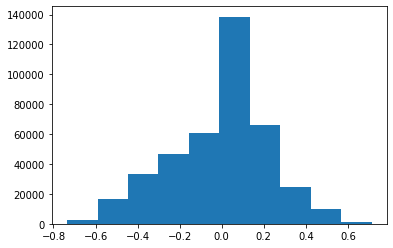

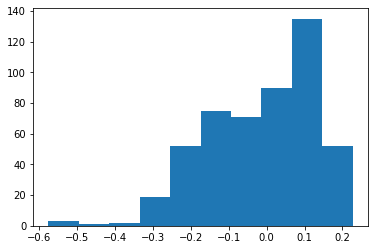

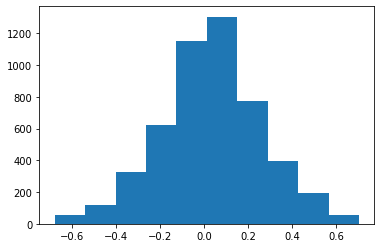

...

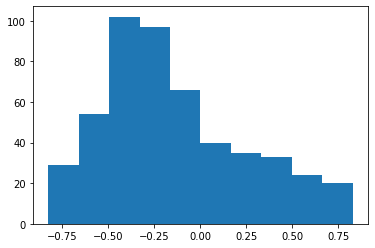

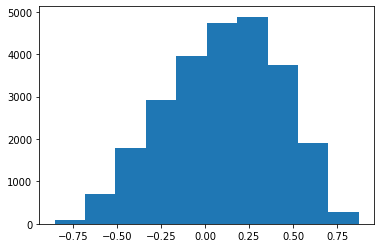

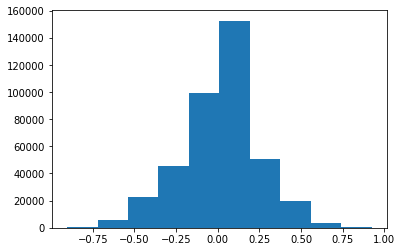

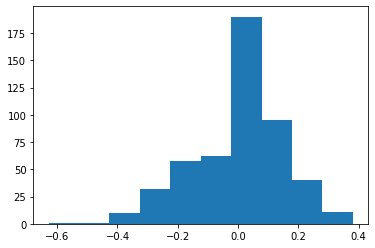

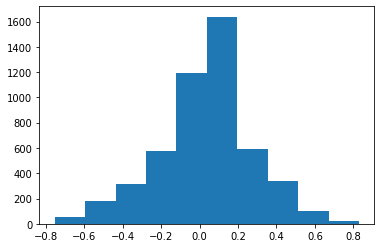

Train Epoch: 0 [1280/60000 (2%)]	Loss: 0.577478


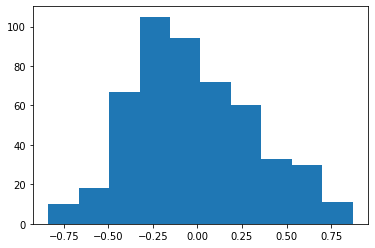

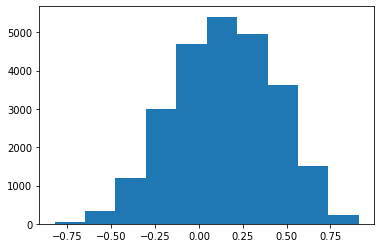

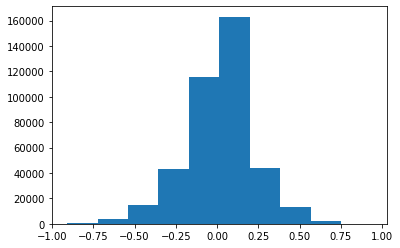

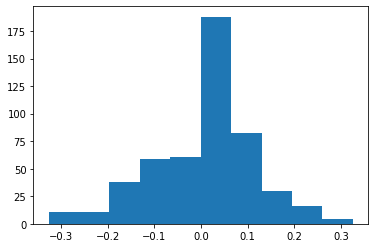

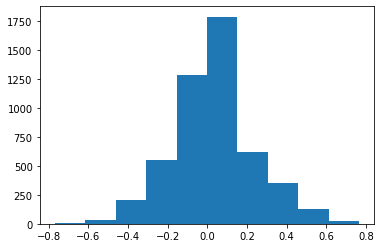

...

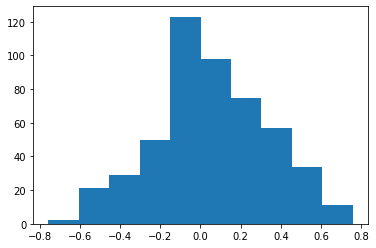

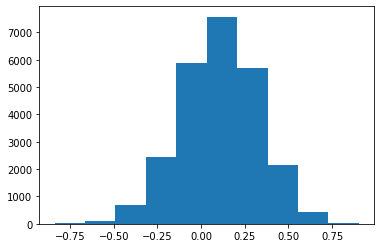

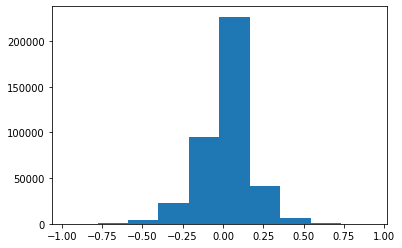

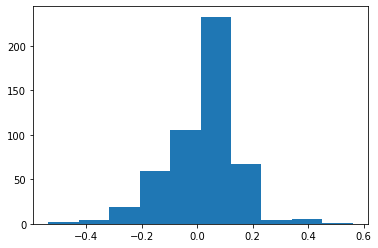

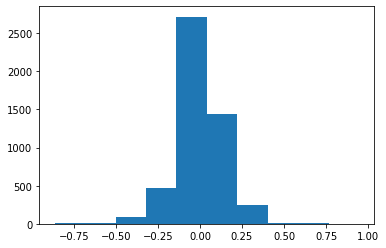

Train Epoch: 0 [1920/60000 (3%)]	Loss: 0.327571


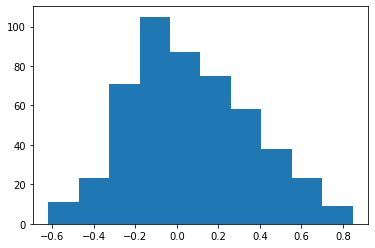

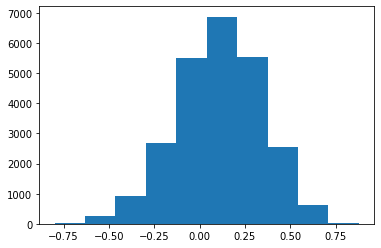

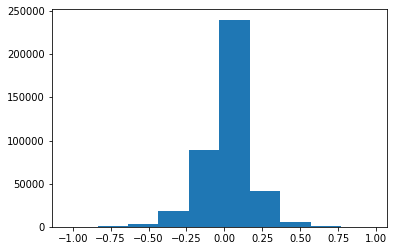

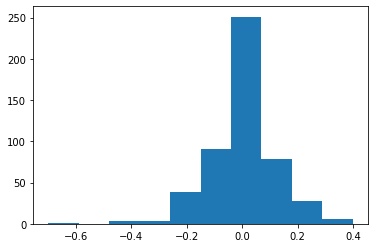

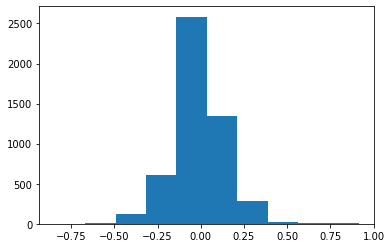

...

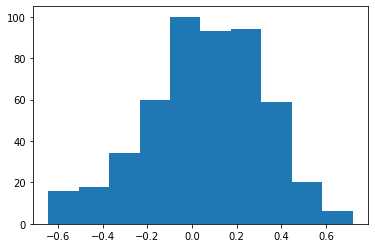

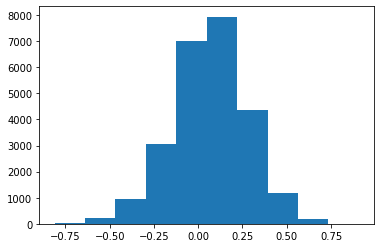

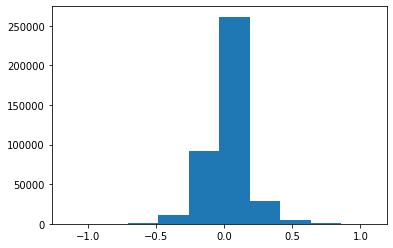

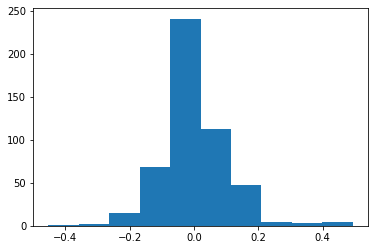

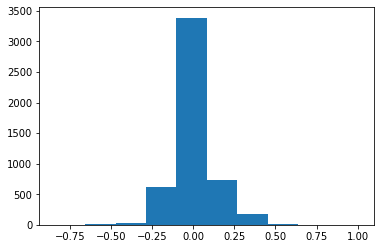

Train Epoch: 0 [2560/60000 (4%)]	Loss: 0.556718


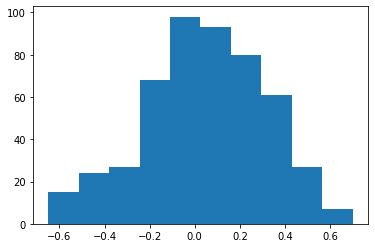

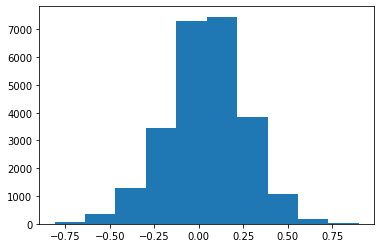

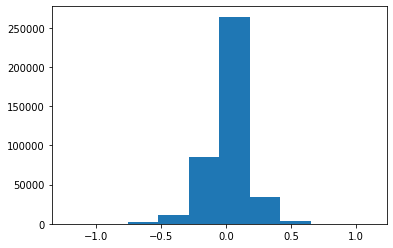

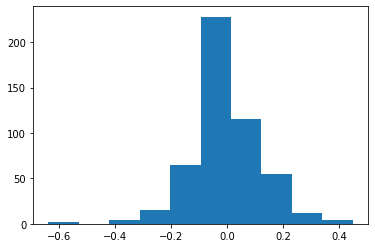

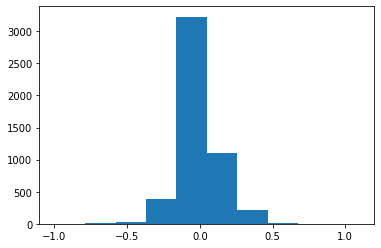

...

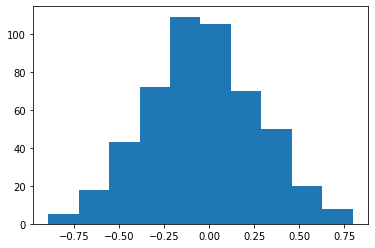

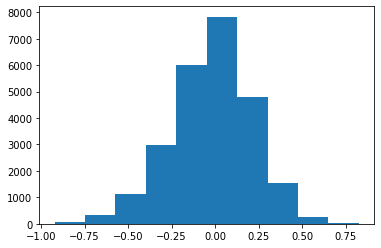

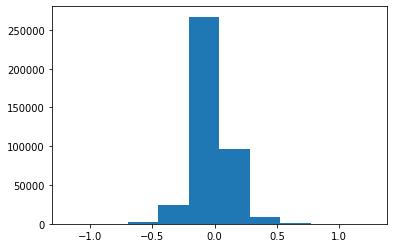

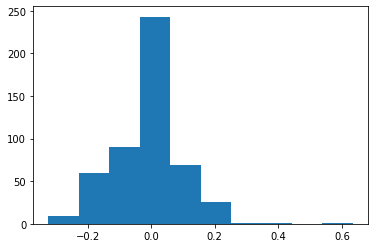

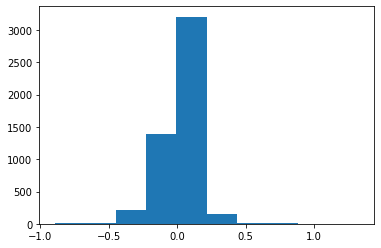

Train Epoch: 0 [3200/60000 (5%)]	Loss: 0.391143


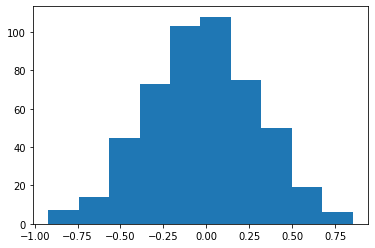

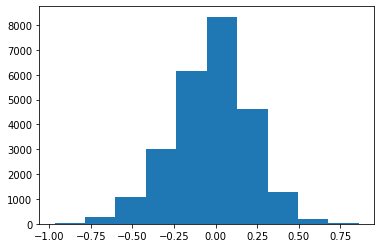

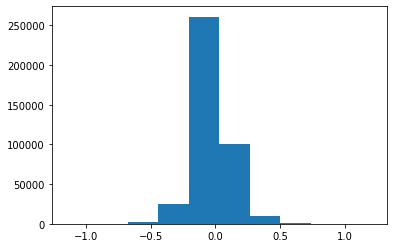

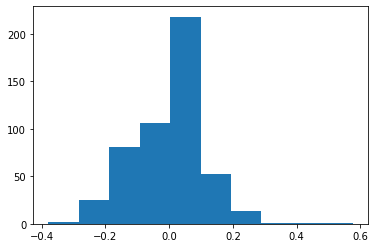

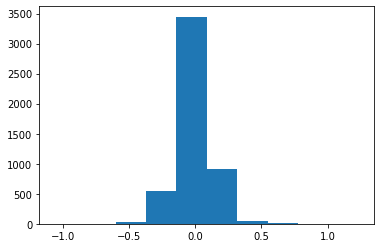

...

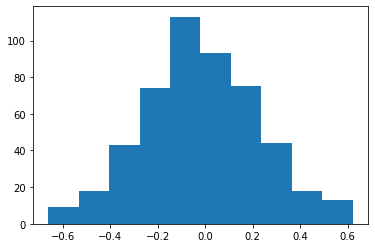

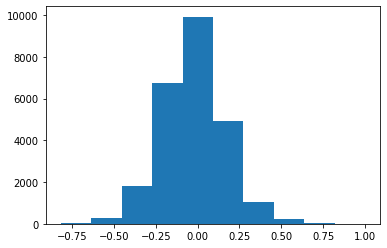

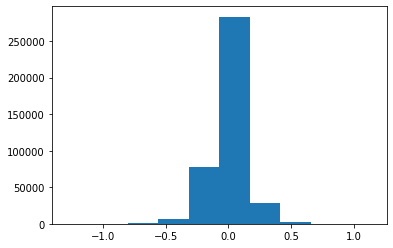

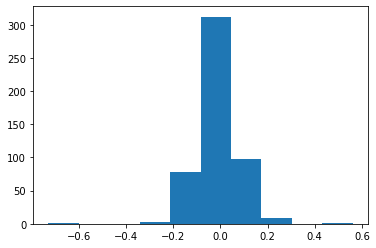

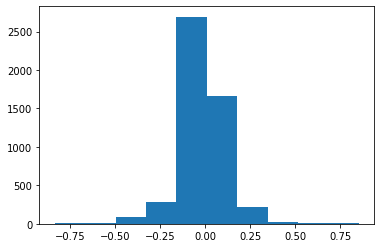

Train Epoch: 0 [3840/60000 (6%)]	Loss: 0.184299


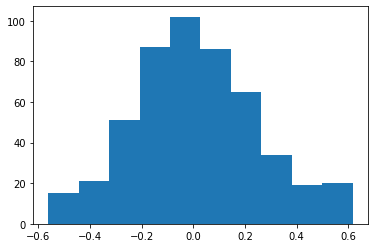

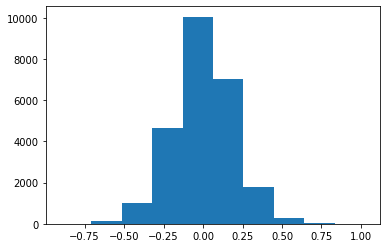

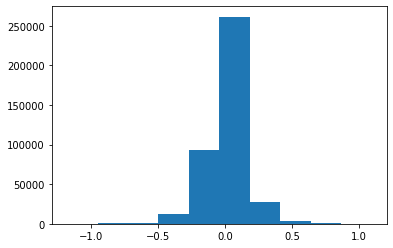

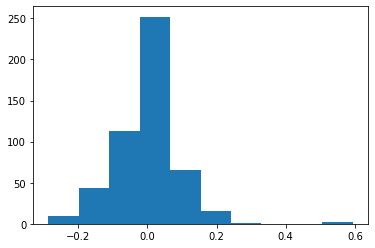

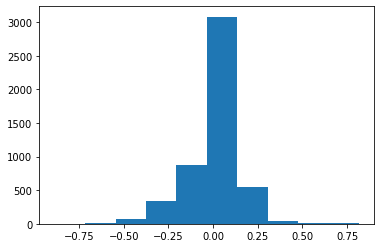

...

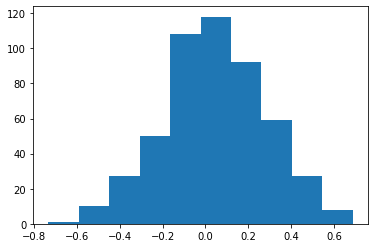

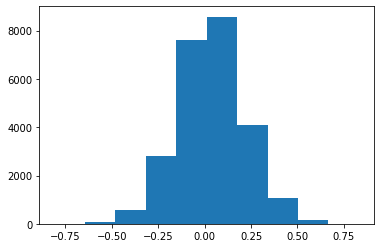

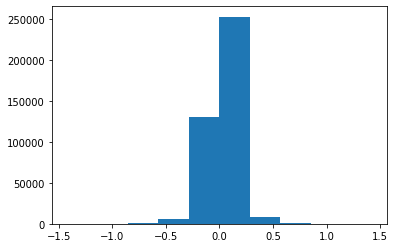

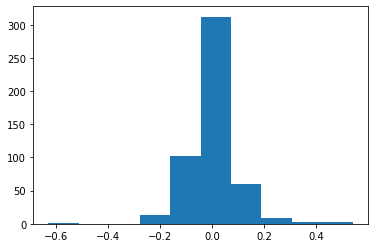

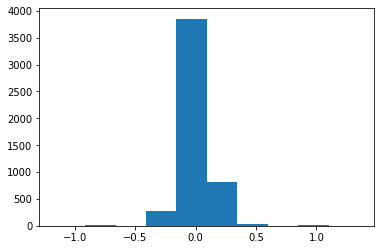

Train Epoch: 0 [4480/60000 (7%)]	Loss: 0.173265


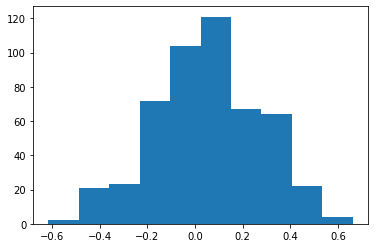

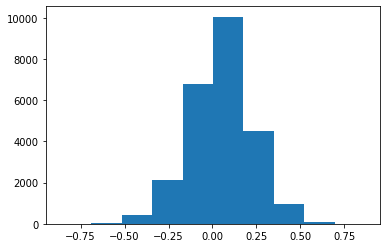

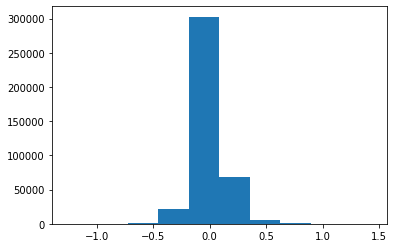

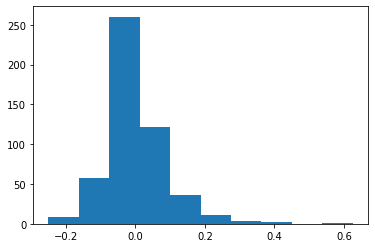

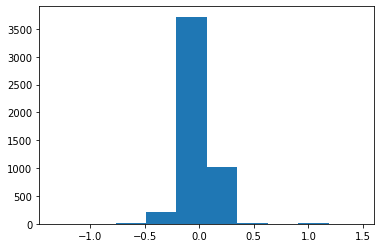

...

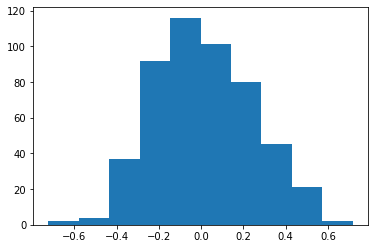

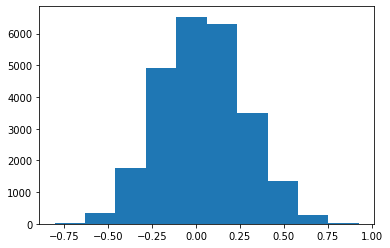

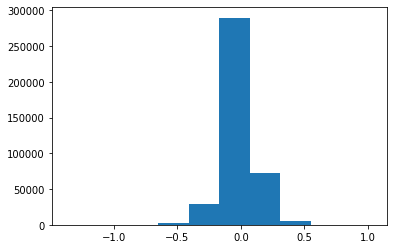

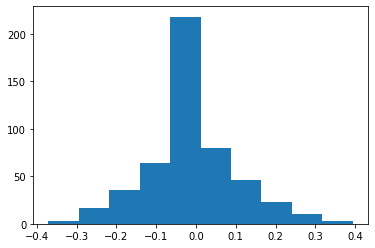

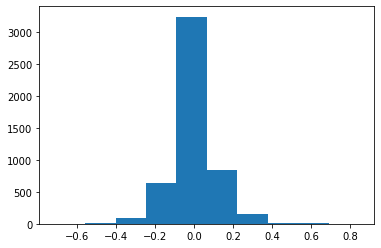

Train Epoch: 0 [5120/60000 (9%)]	Loss: 0.078282


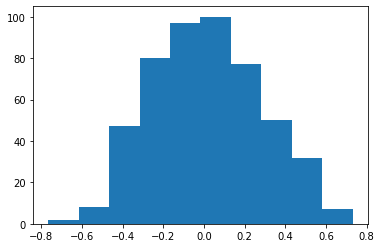

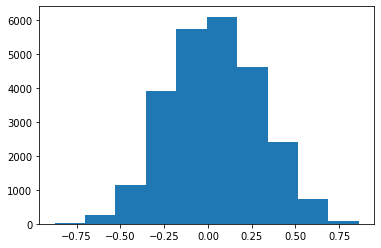

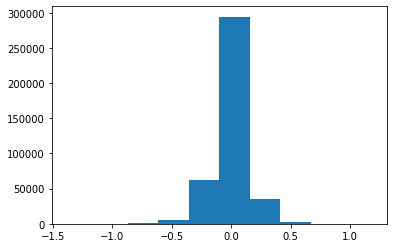

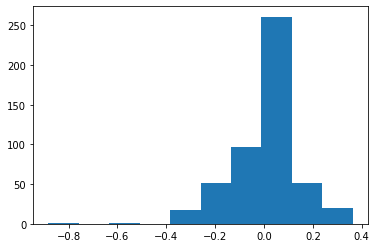

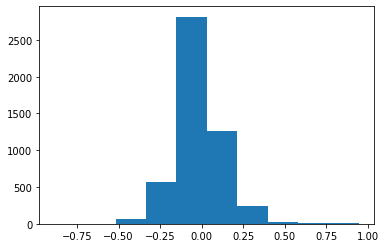

...

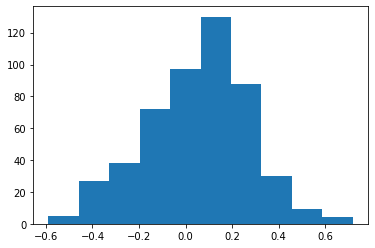

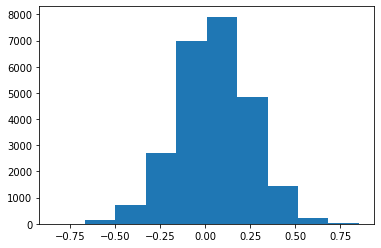

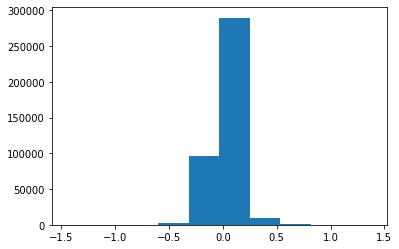

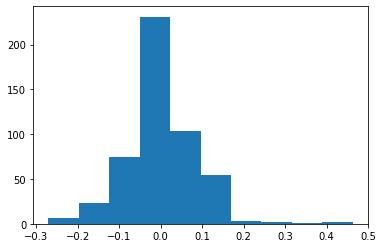

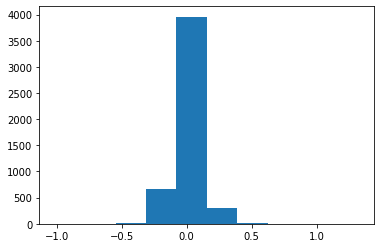

Train Epoch: 0 [5760/60000 (10%)]	Loss: 0.164990


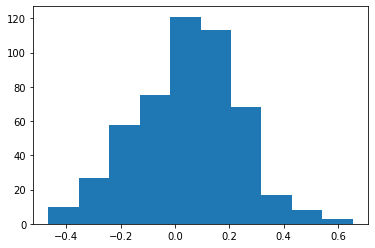

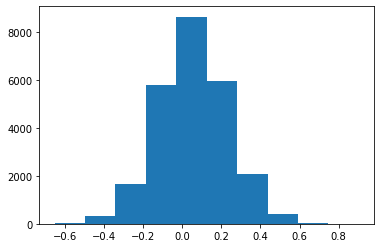

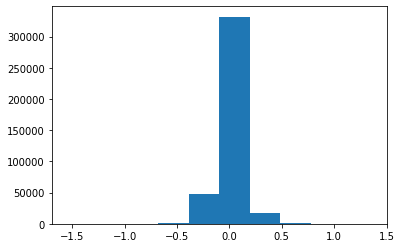

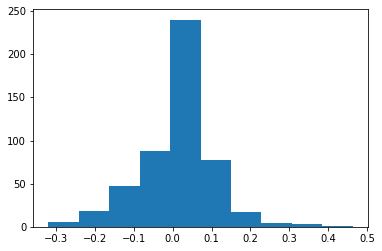

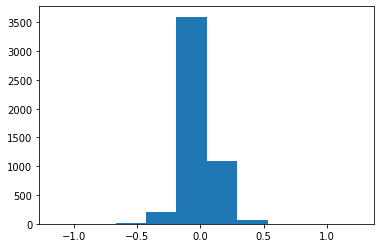

...

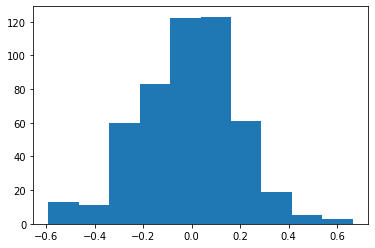

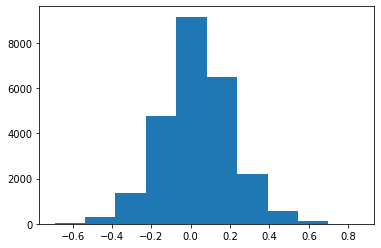

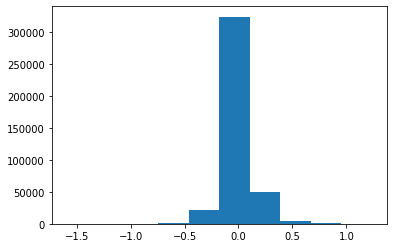

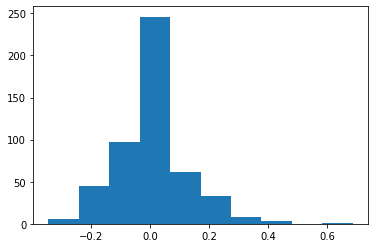

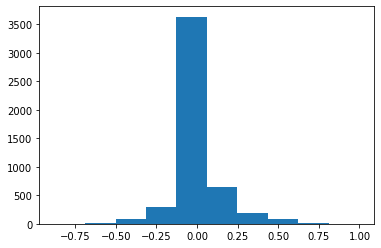

Train Epoch: 0 [6400/60000 (11%)]	Loss: 0.115368


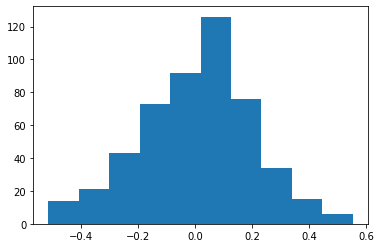

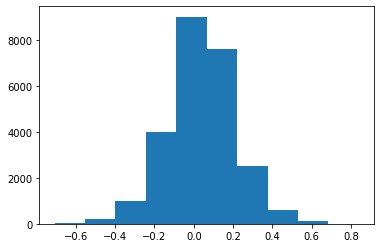

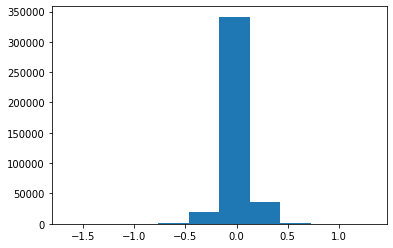

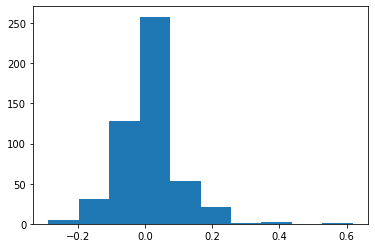

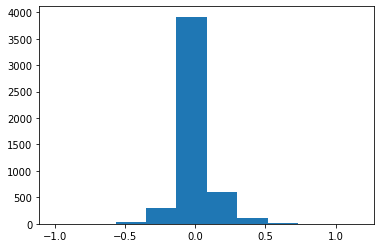

...

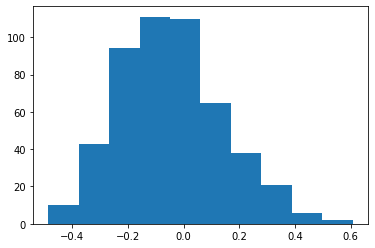

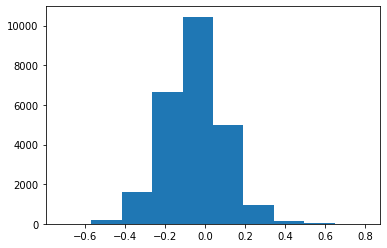

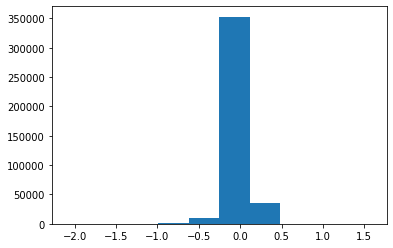

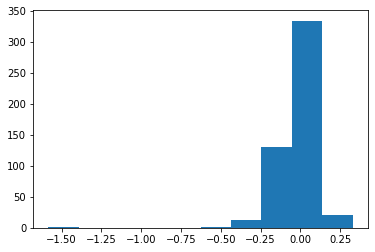

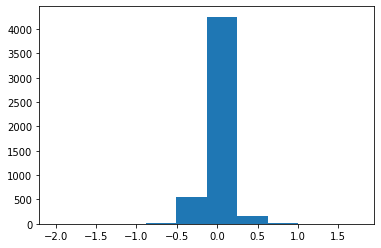

Train Epoch: 0 [7040/60000 (12%)]	Loss: 0.179103


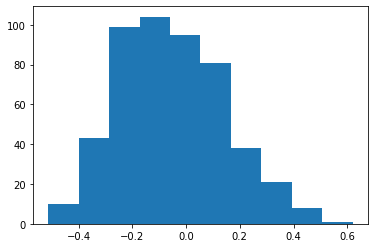

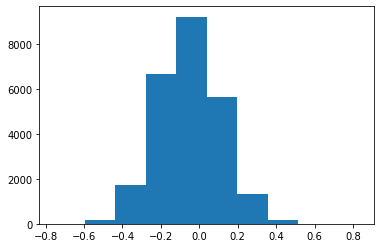

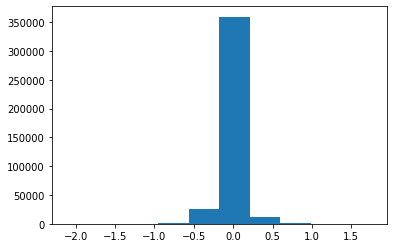

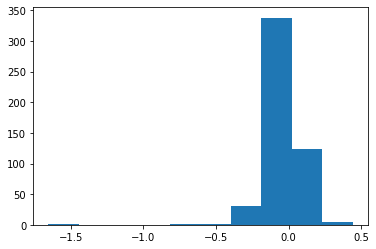

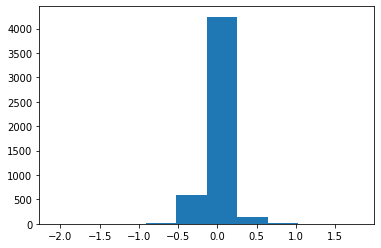

...

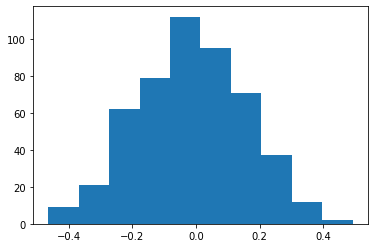

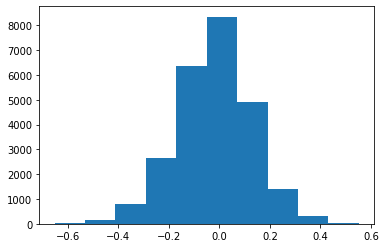

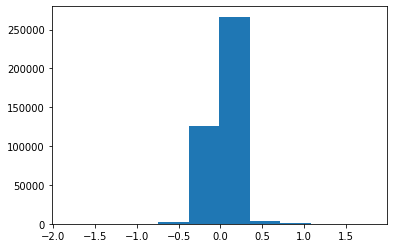

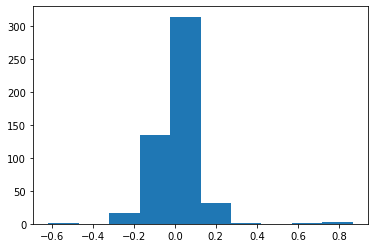

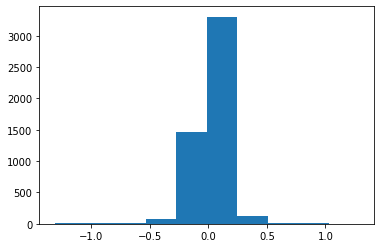

Train Epoch: 0 [7680/60000 (13%)]	Loss: 0.064265


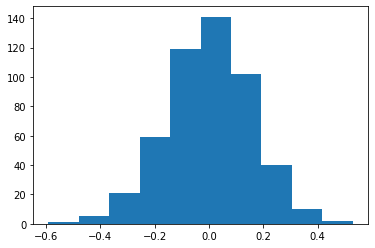

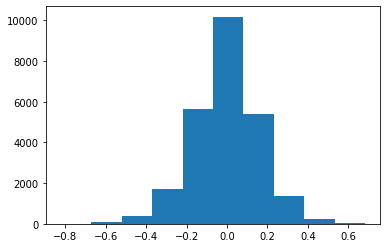

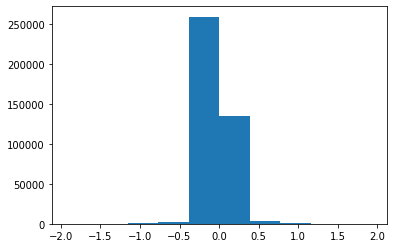

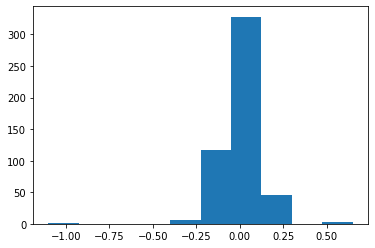

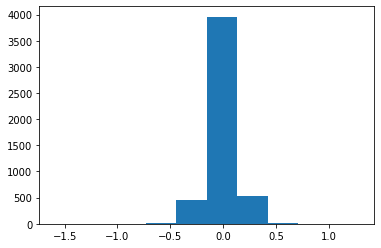

...

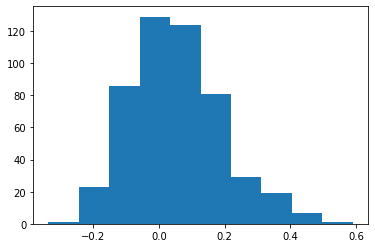

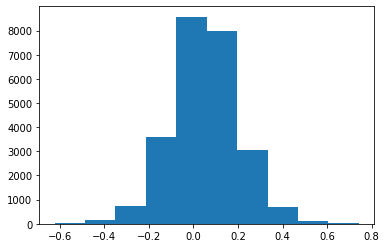

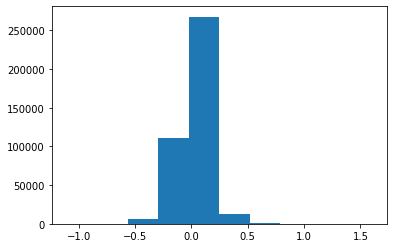

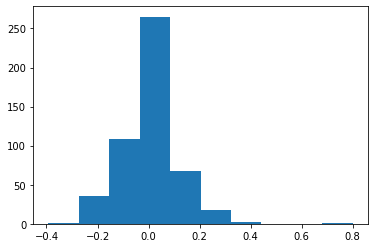

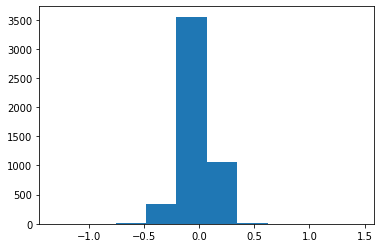

Train Epoch: 0 [8320/60000 (14%)]	Loss: 0.298935


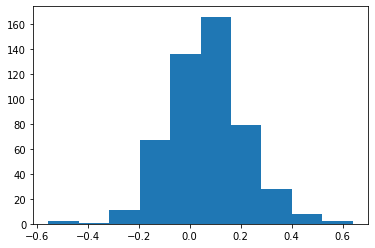

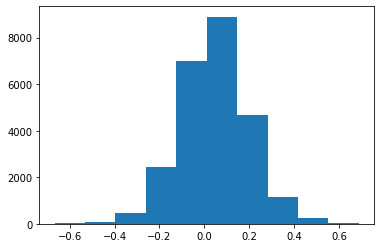

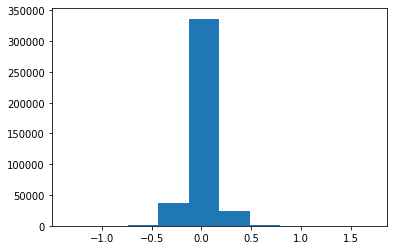

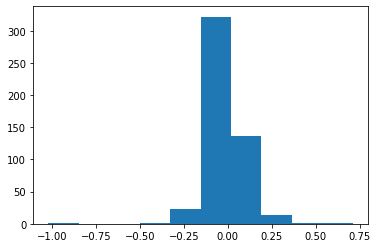

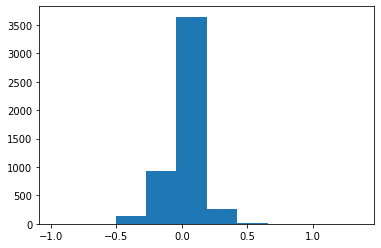

...

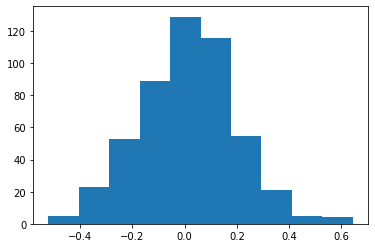

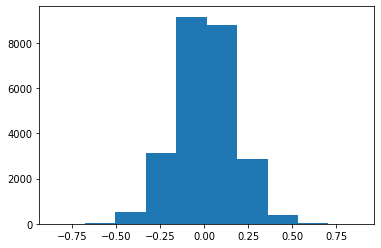

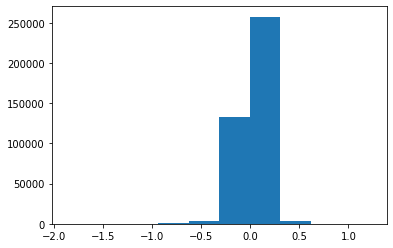

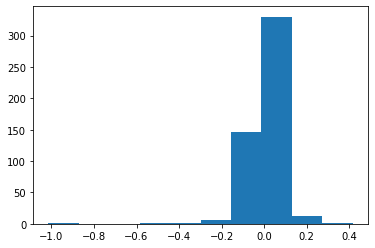

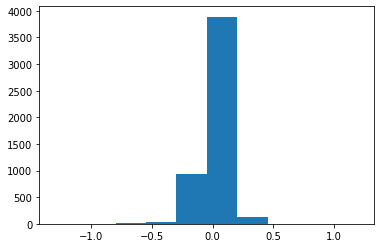

Train Epoch: 0 [8960/60000 (15%)]	Loss: 0.104086


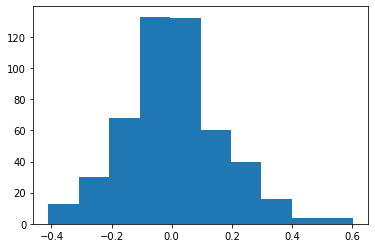

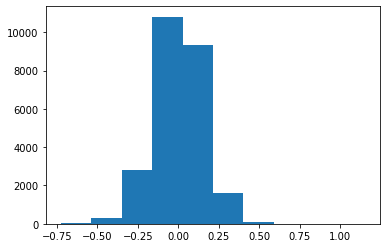

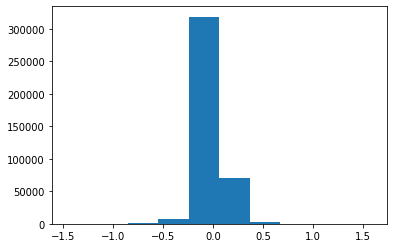

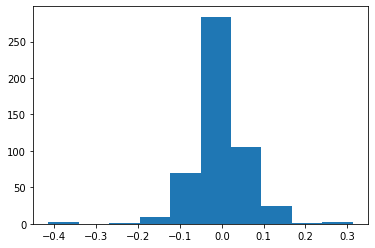

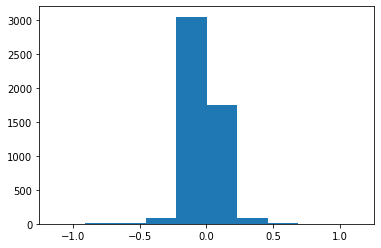

...

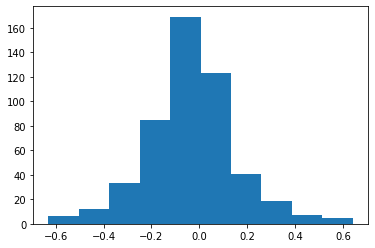

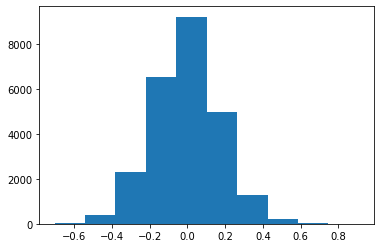

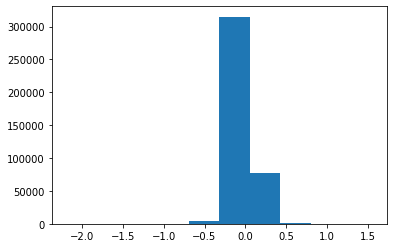

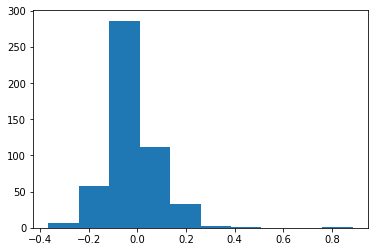

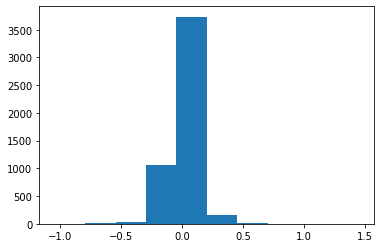

Train Epoch: 0 [9600/60000 (16%)]	Loss: 0.130659


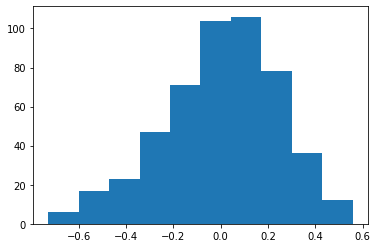

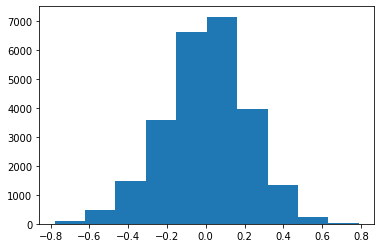

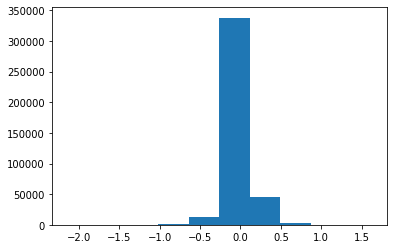

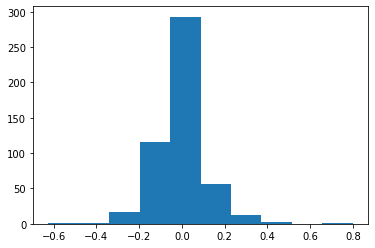

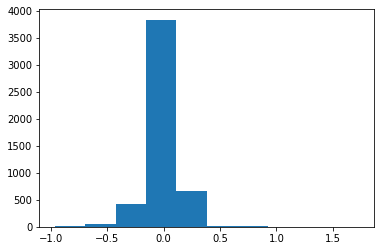

...

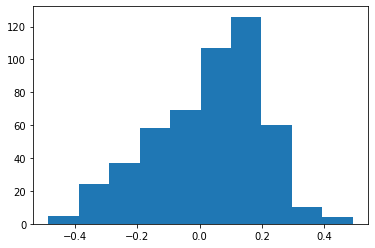

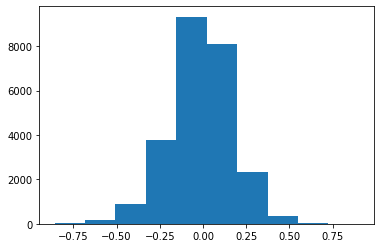

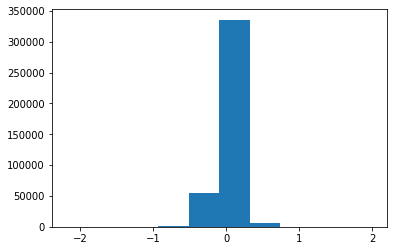

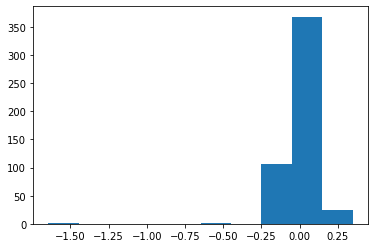

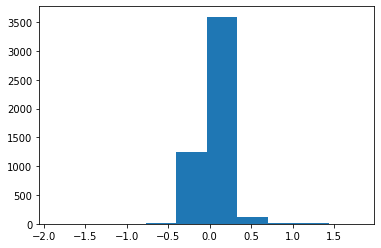

Train Epoch: 0 [10240/60000 (17%)]	Loss: 0.133130


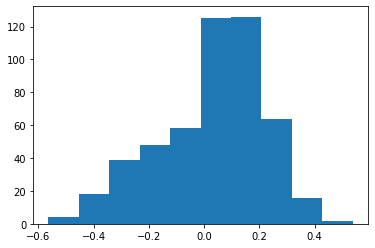

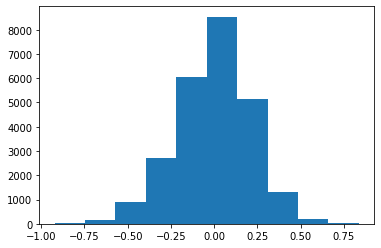

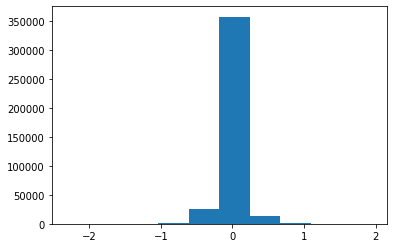

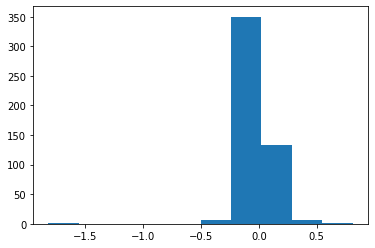

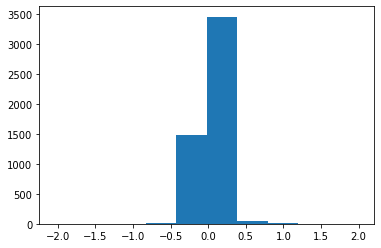

...

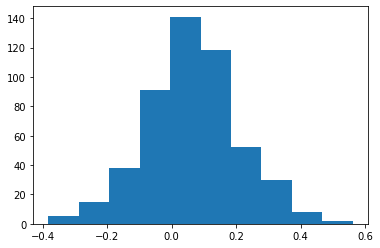

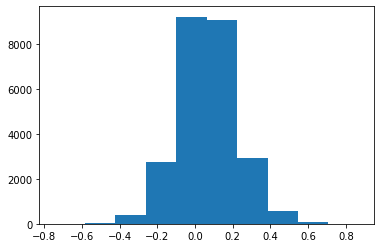

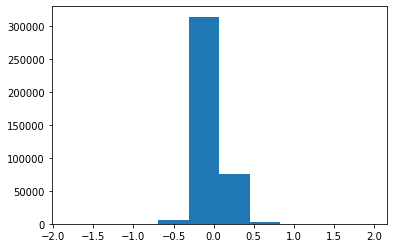

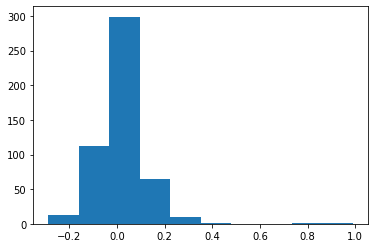

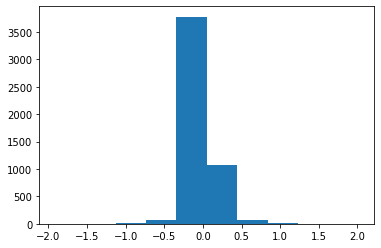

Train Epoch: 0 [10880/60000 (18%)]	Loss: 0.397834


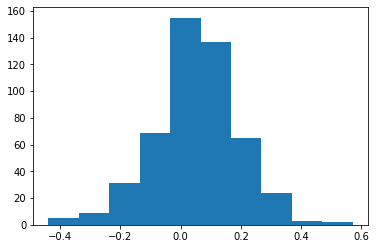

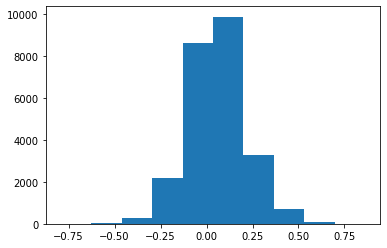

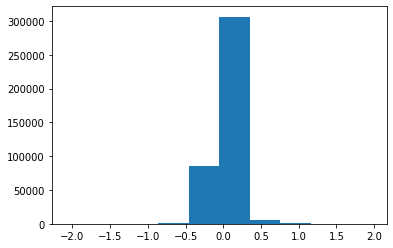

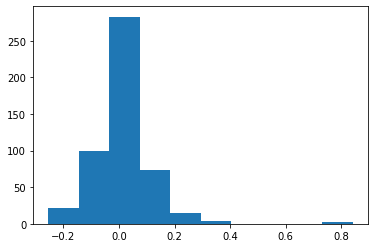

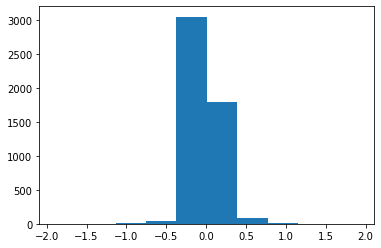

...

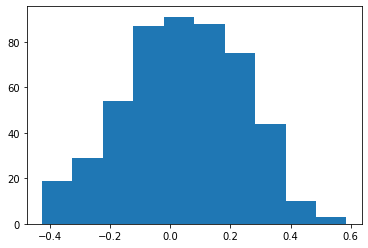

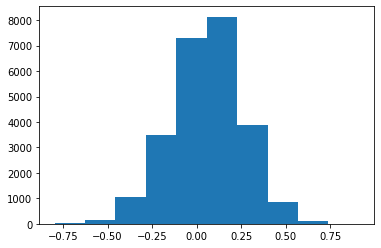

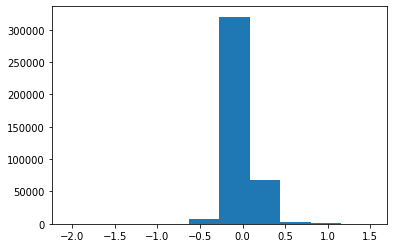

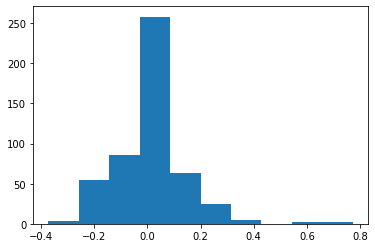

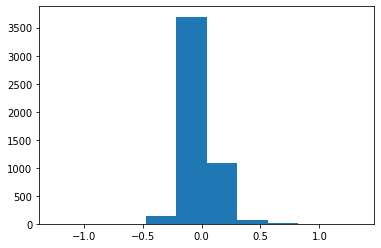

Train Epoch: 0 [11520/60000 (19%)]	Loss: 0.103605


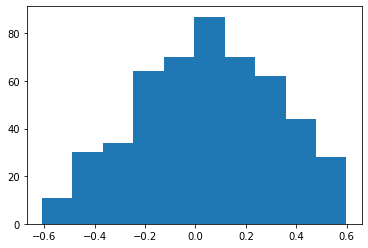

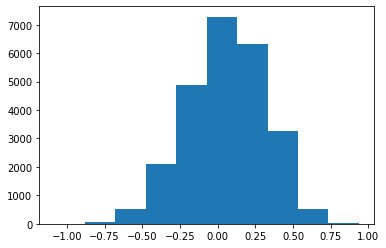

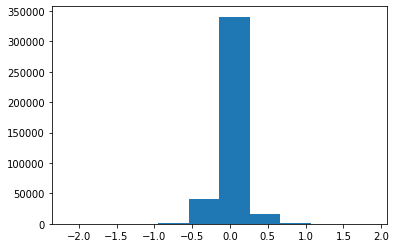

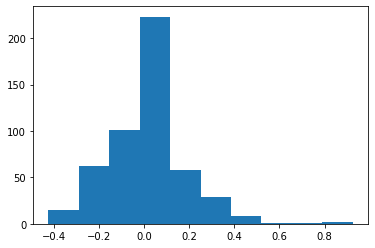

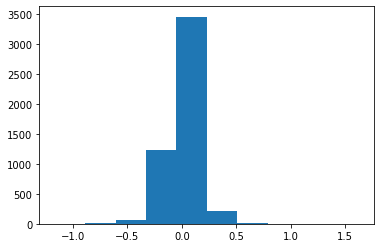

...

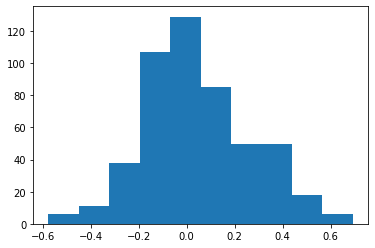

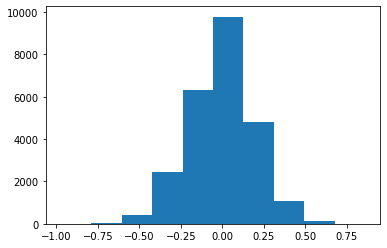

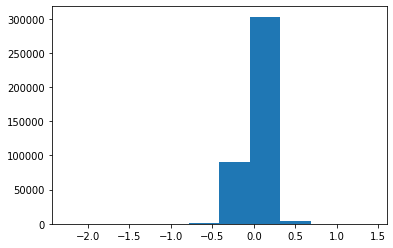

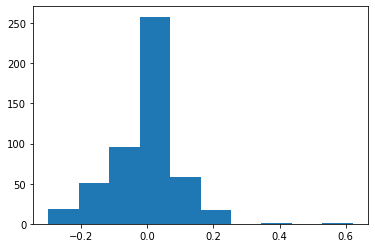

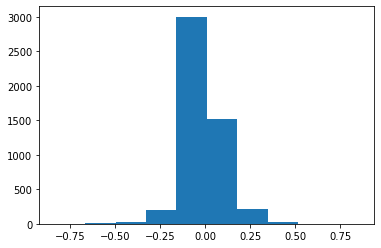

Train Epoch: 0 [12160/60000 (20%)]	Loss: 0.108341


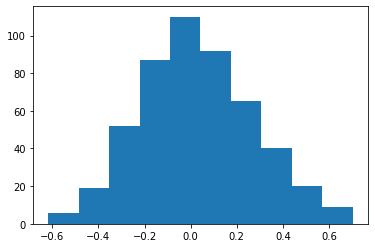

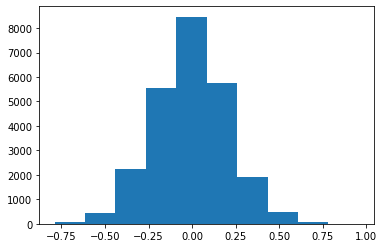

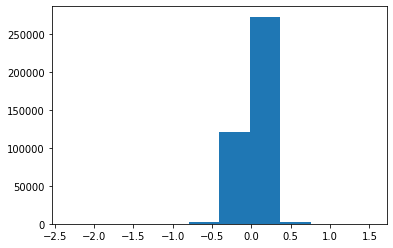

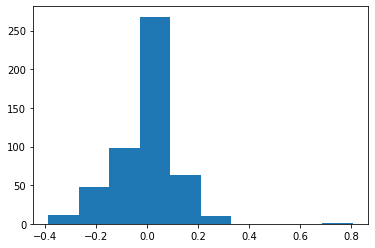

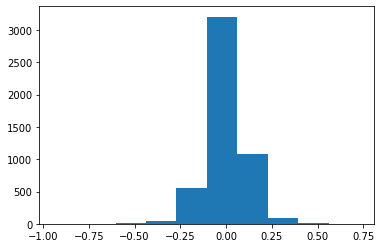

...

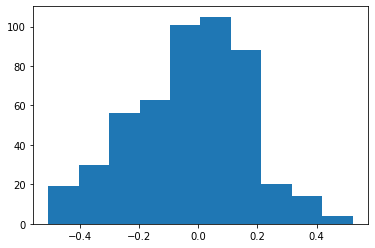

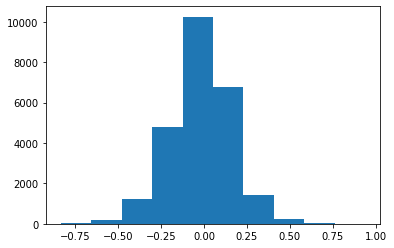

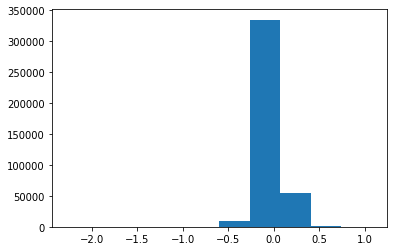

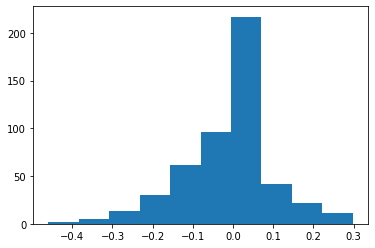

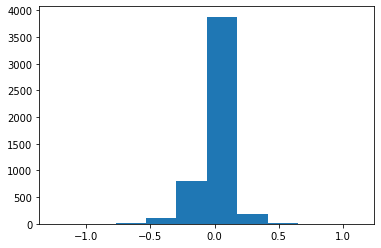

Train Epoch: 0 [12800/60000 (21%)]	Loss: 0.099768


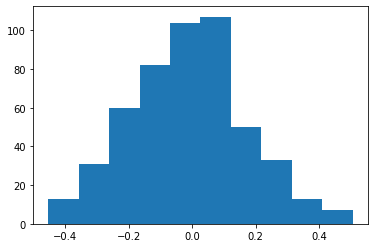

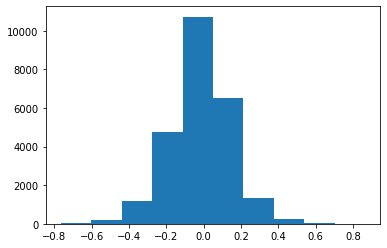

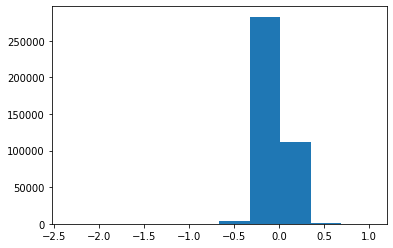

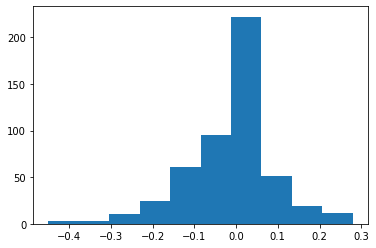

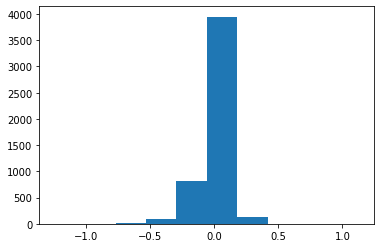

...

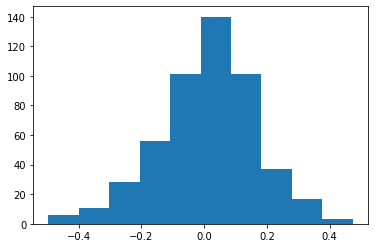

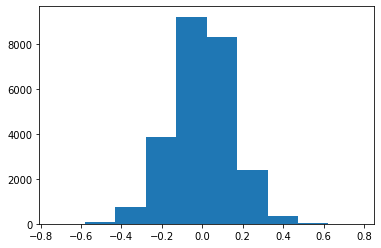

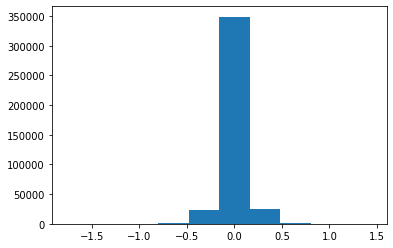

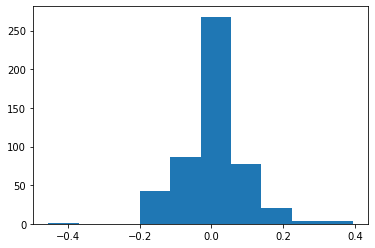

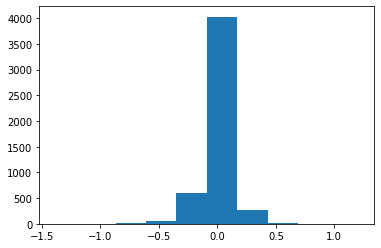

Train Epoch: 0 [13440/60000 (22%)]	Loss: 0.176600


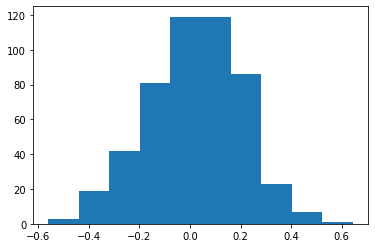

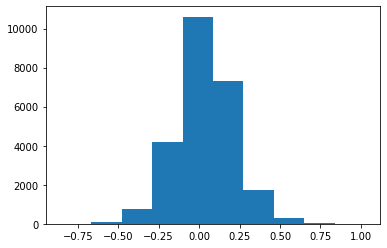

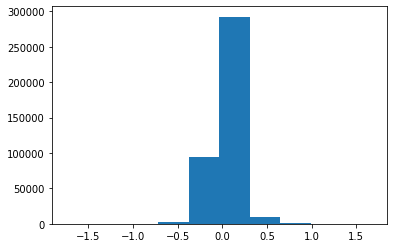

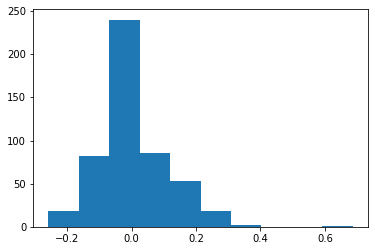

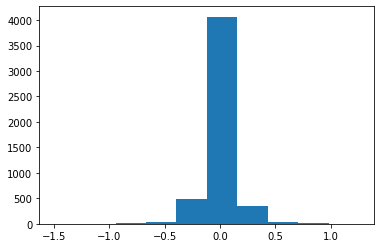

...

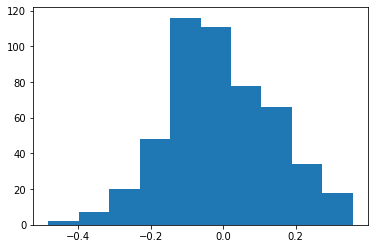

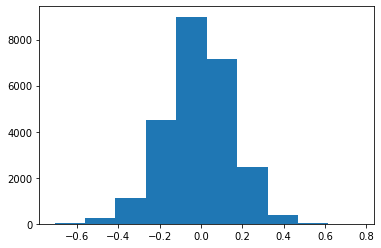

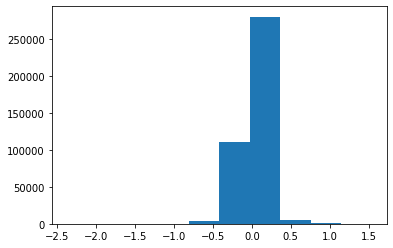

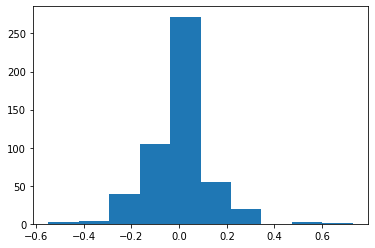

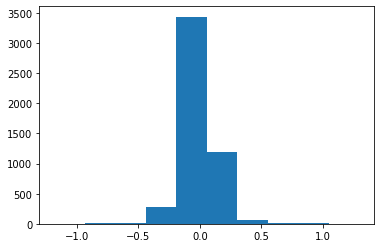

Train Epoch: 0 [14080/60000 (23%)]	Loss: 0.182757


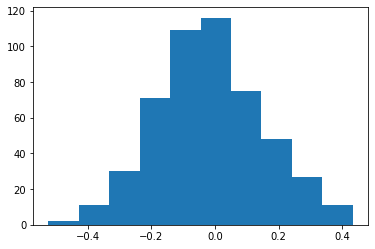

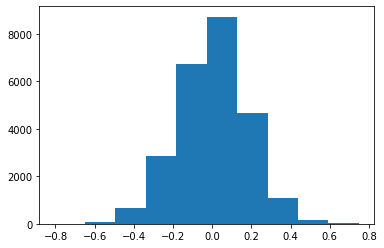

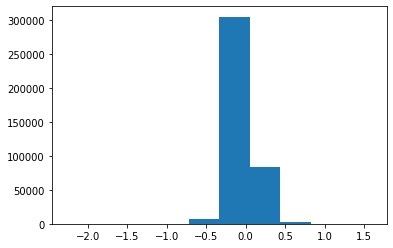

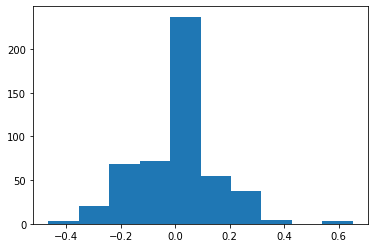

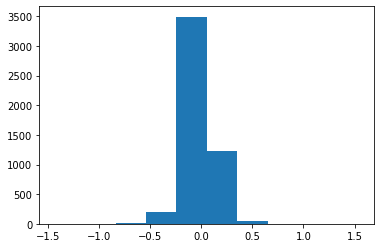

...

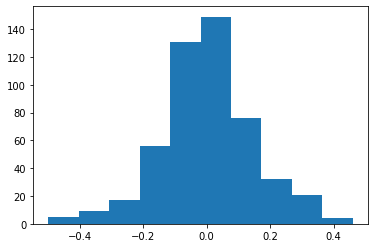

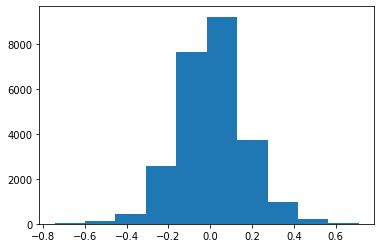

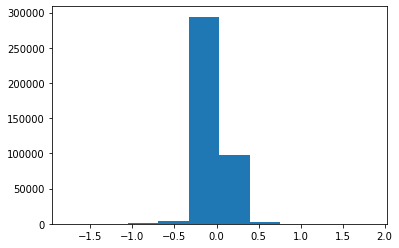

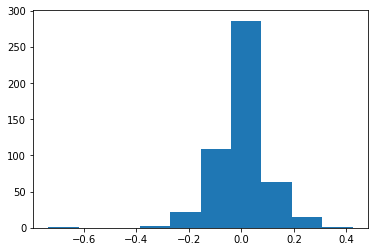

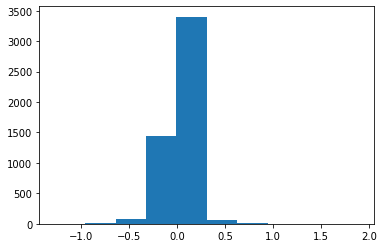

Train Epoch: 0 [14720/60000 (25%)]	Loss: 0.118002


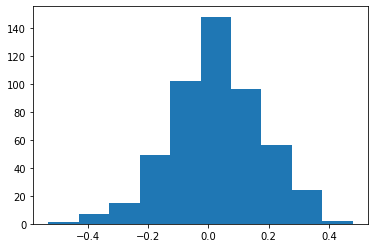

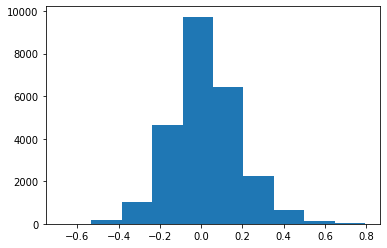

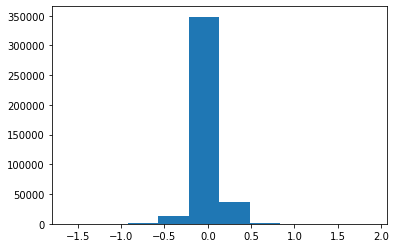

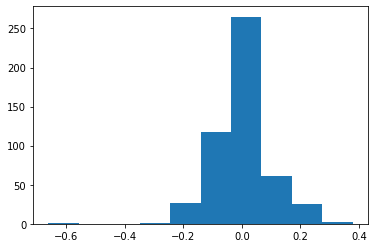

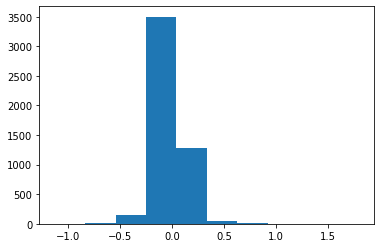

...

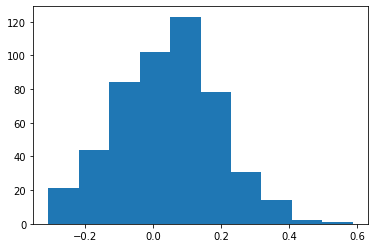

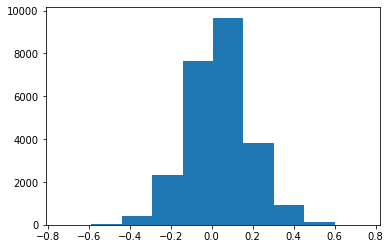

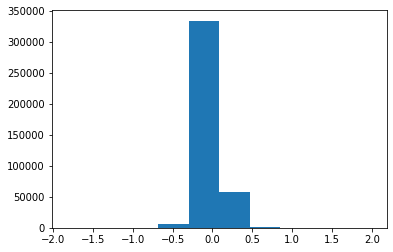

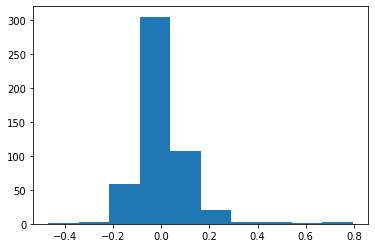

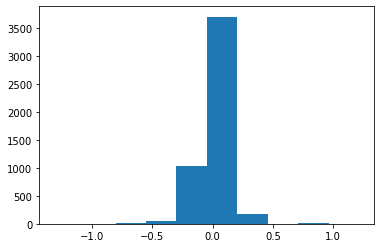

Train Epoch: 0 [15360/60000 (26%)]	Loss: 0.072672


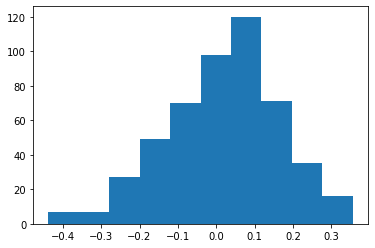

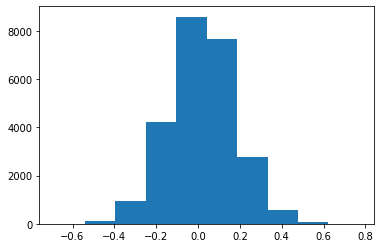

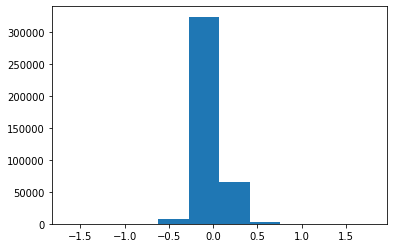

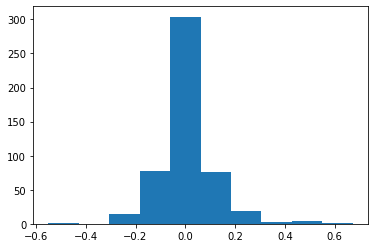

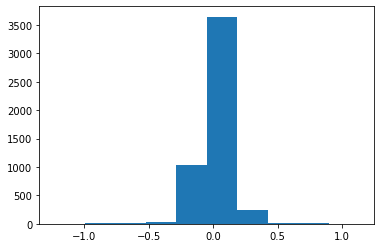

...

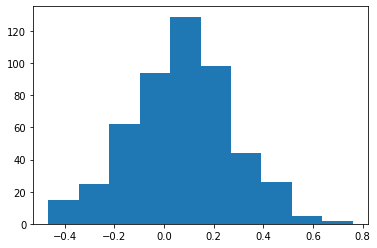

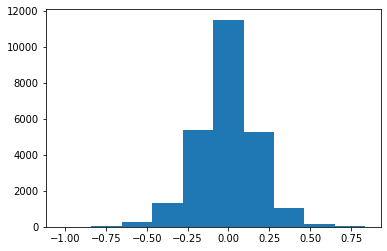

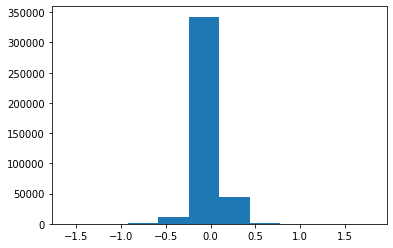

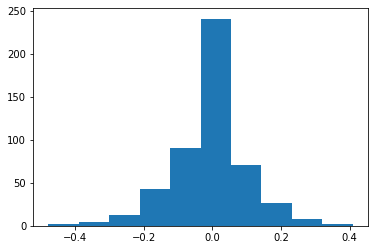

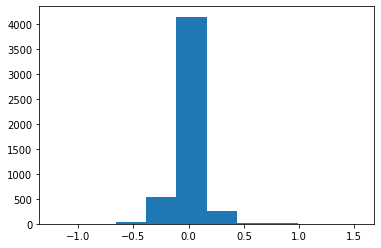

Train Epoch: 0 [16000/60000 (27%)]	Loss: 0.108404


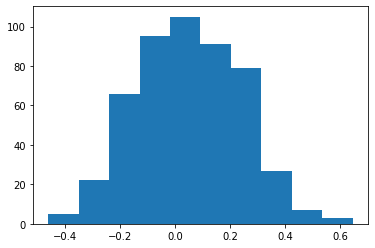

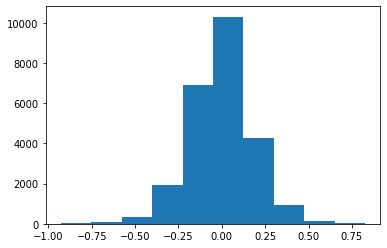

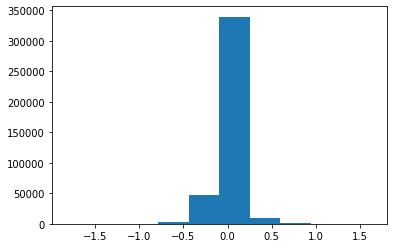

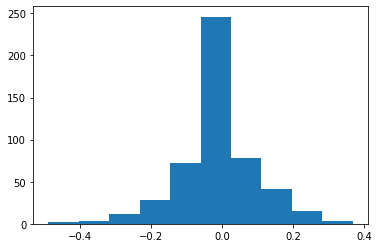

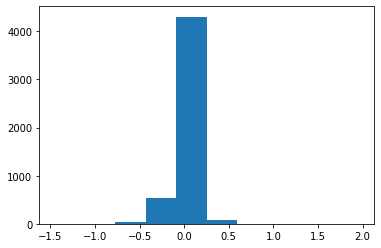

...

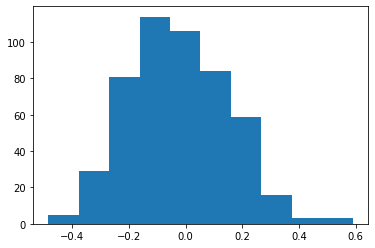

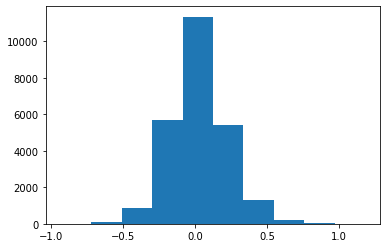

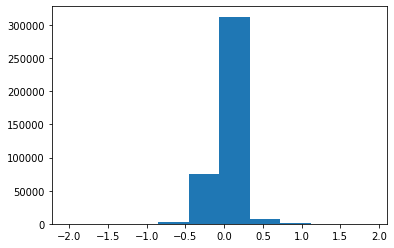

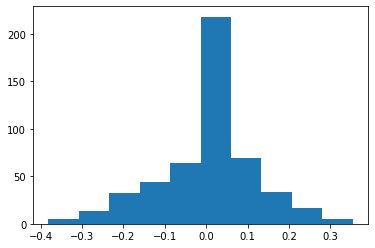

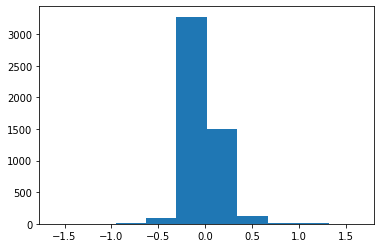

Train Epoch: 0 [16640/60000 (28%)]	Loss: 0.145824


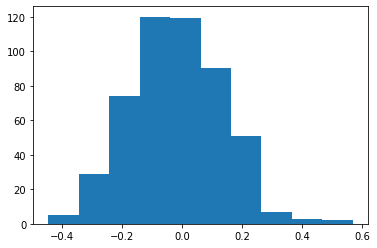

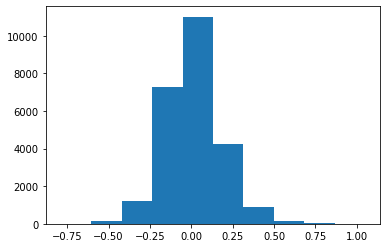

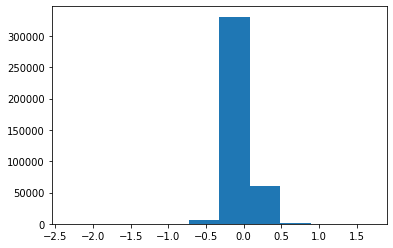

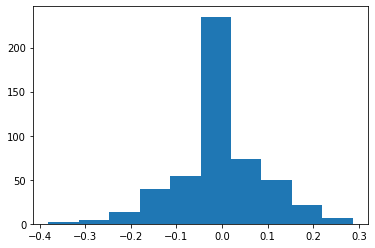

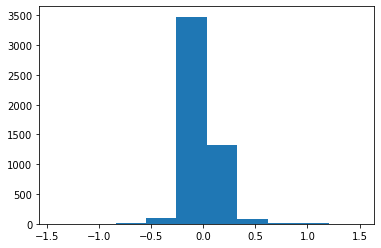

...

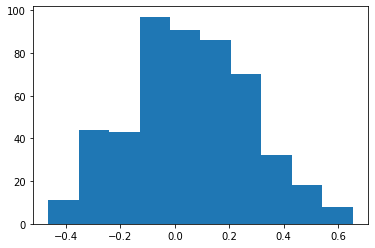

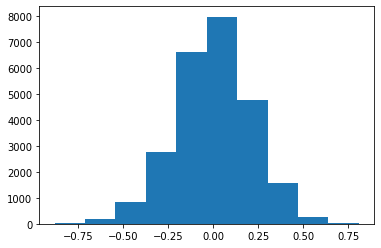

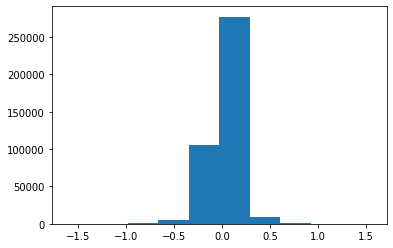

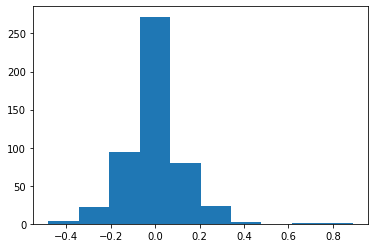

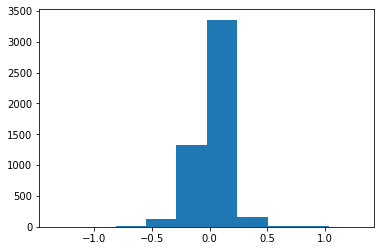

Train Epoch: 0 [17280/60000 (29%)]	Loss: 0.078042


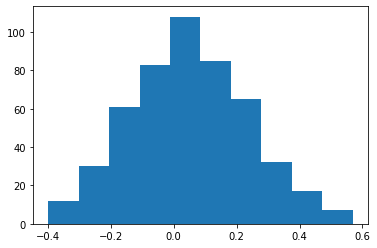

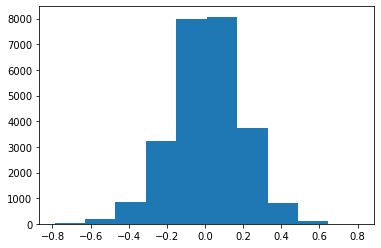

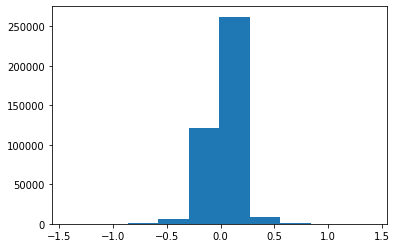

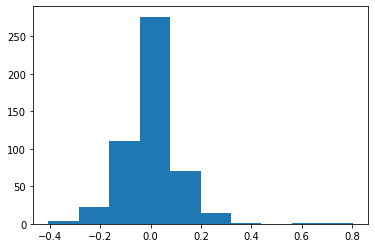

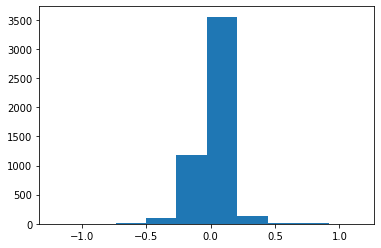

...

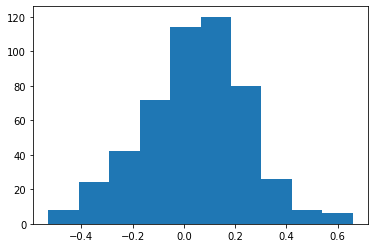

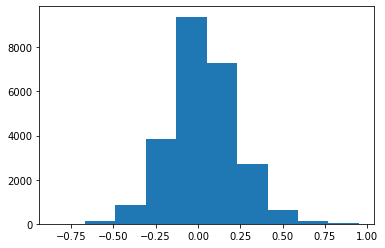

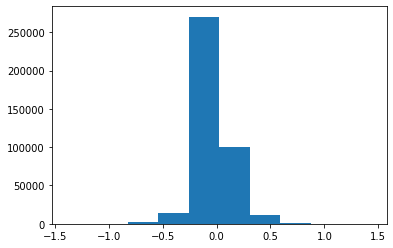

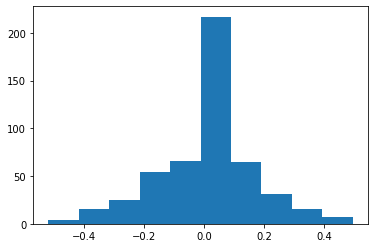

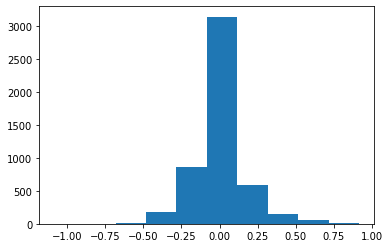

Train Epoch: 0 [17920/60000 (30%)]	Loss: 0.014146


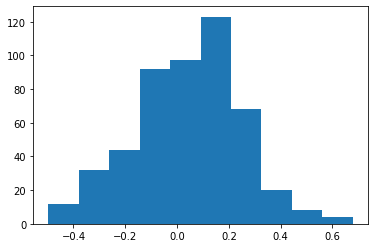

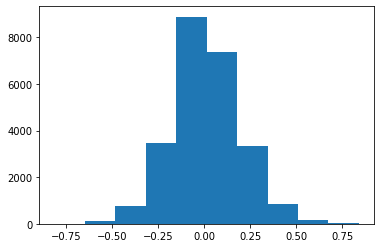

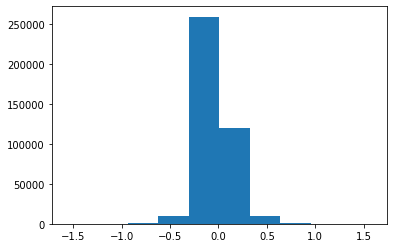

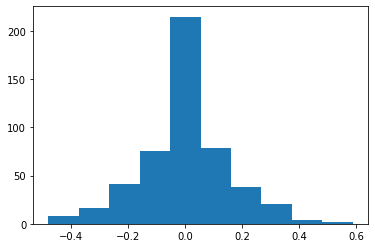

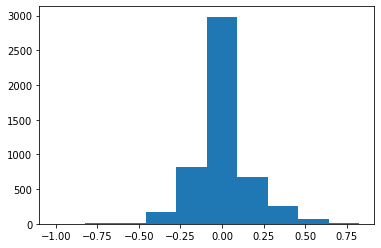

...

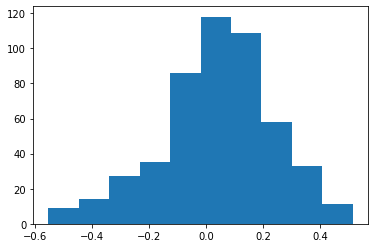

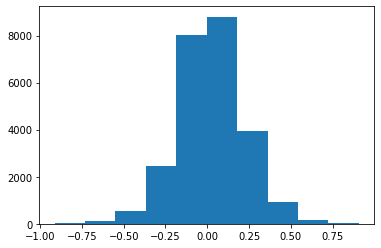

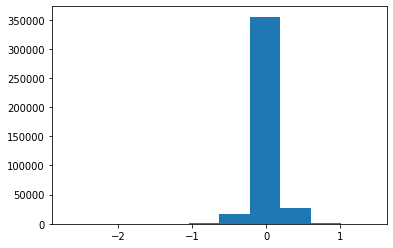

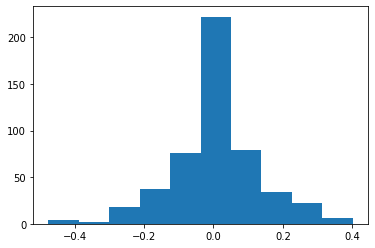

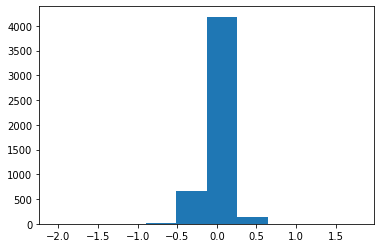

Train Epoch: 0 [18560/60000 (31%)]	Loss: 0.190880


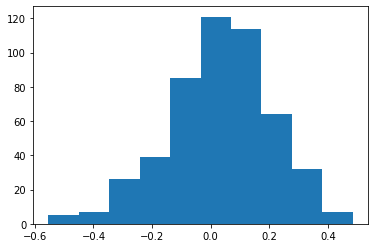

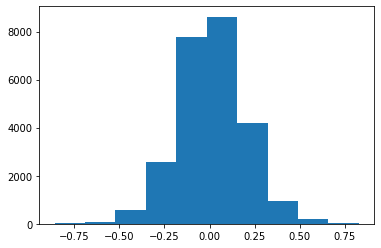

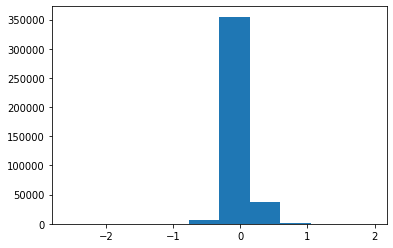

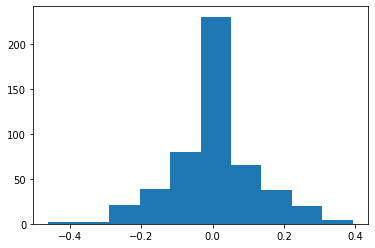

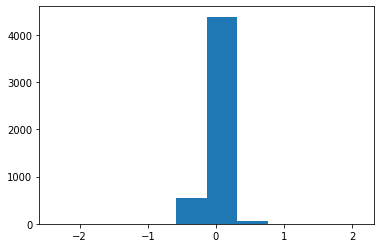

...

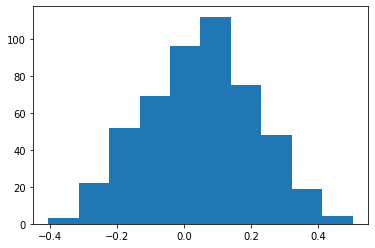

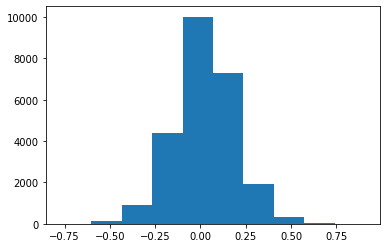

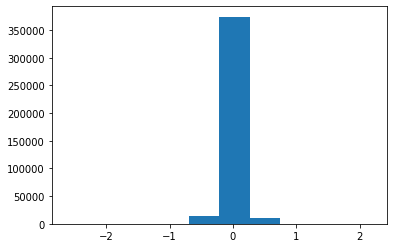

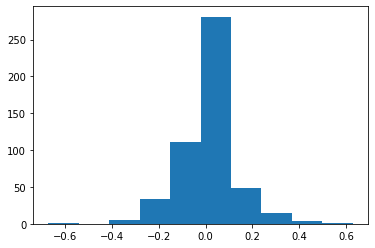

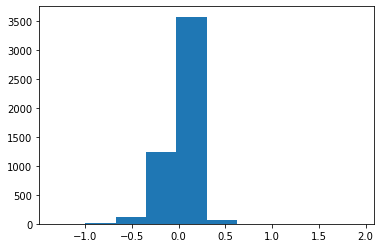

Train Epoch: 0 [19200/60000 (32%)]	Loss: 0.040008


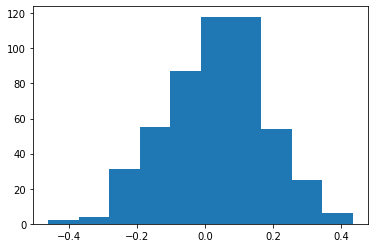

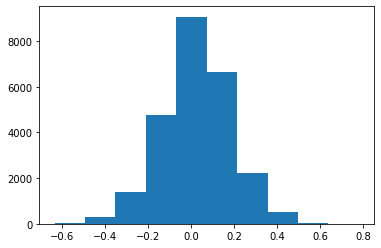

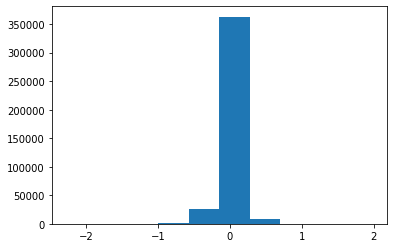

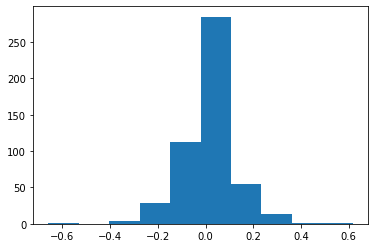

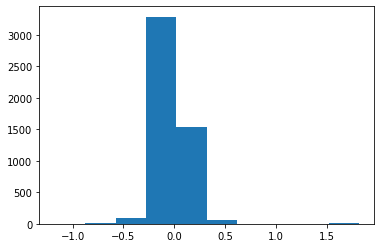

...

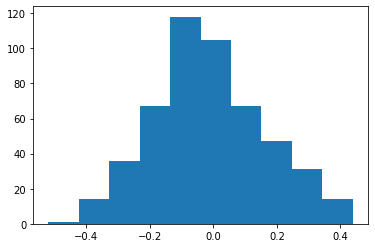

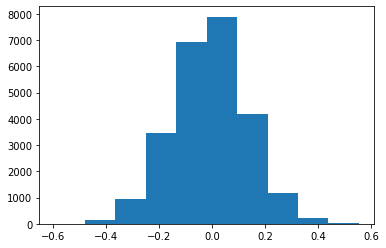

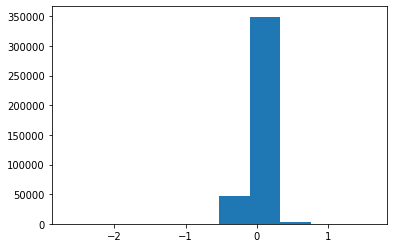

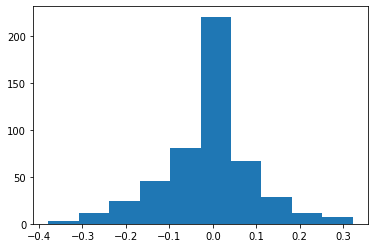

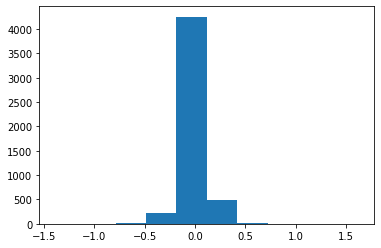

Train Epoch: 0 [19840/60000 (33%)]	Loss: 0.038032


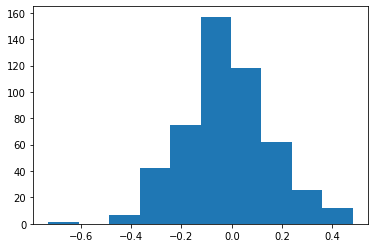

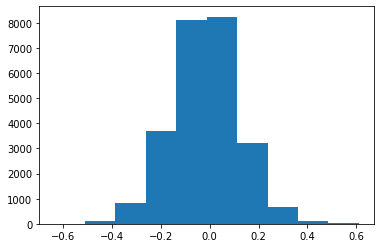

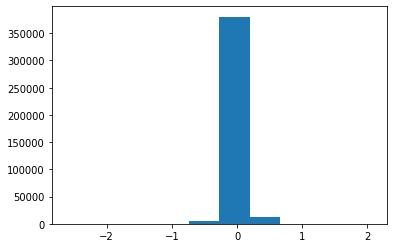

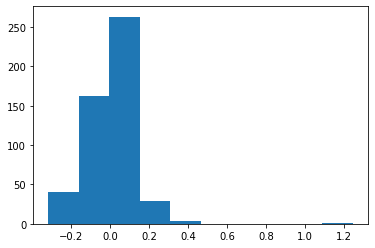

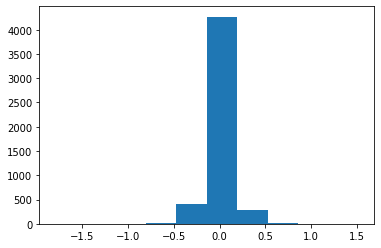

...

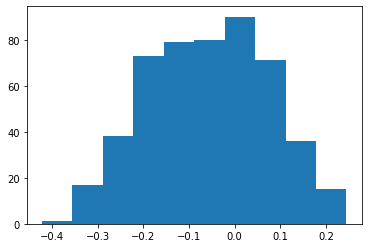

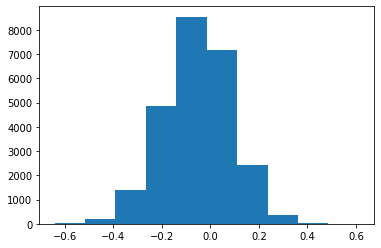

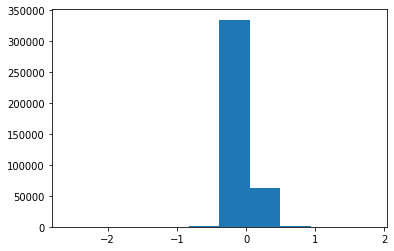

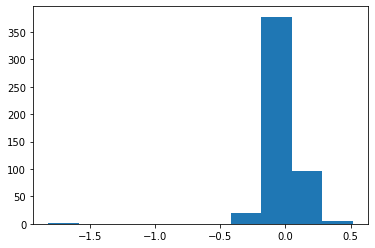

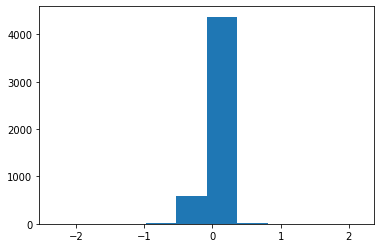

Train Epoch: 0 [20480/60000 (34%)]	Loss: 0.025636


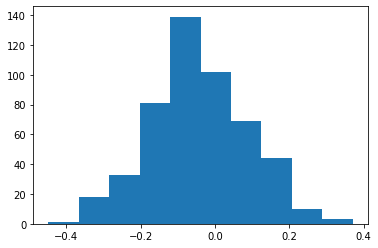

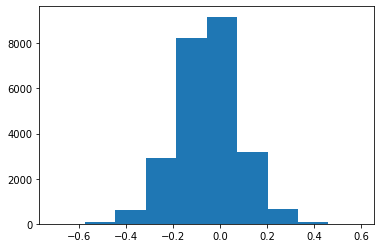

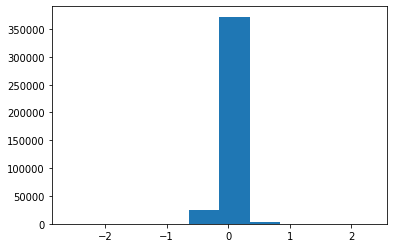

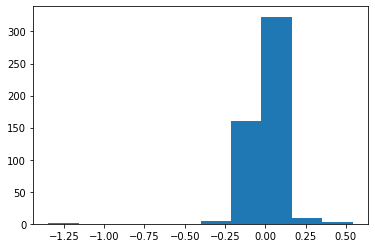

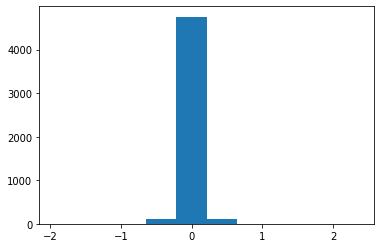

...

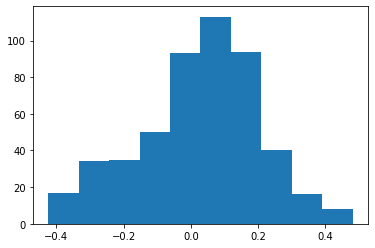

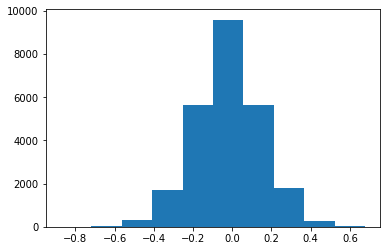

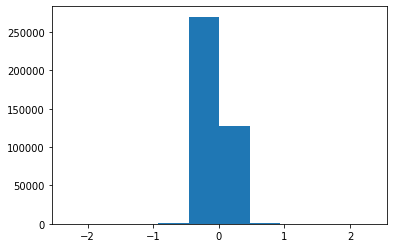

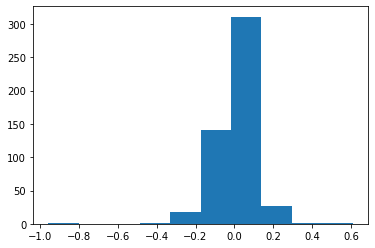

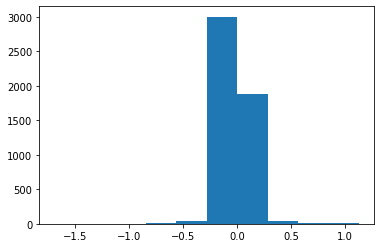

Train Epoch: 0 [21120/60000 (35%)]	Loss: 0.089717


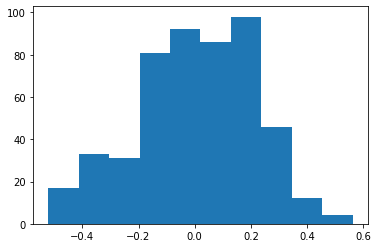

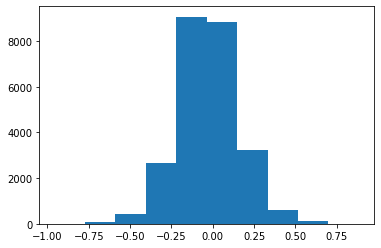

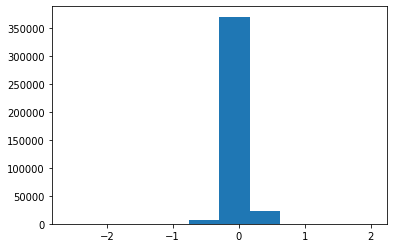

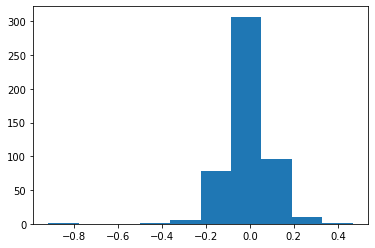

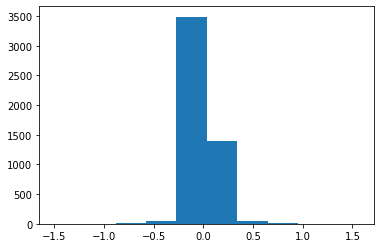

...

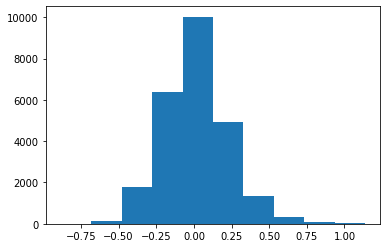

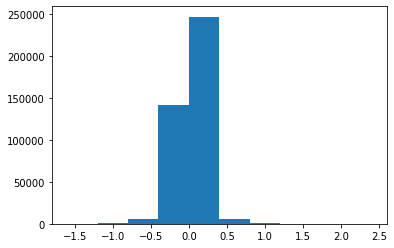

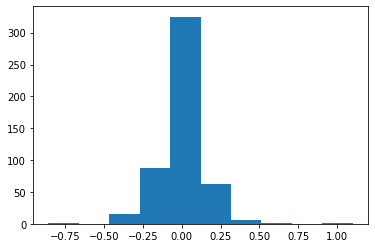

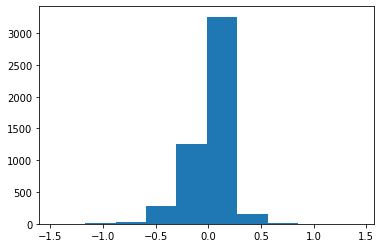

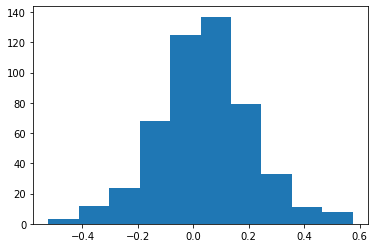

KeyboardInterrupt: 

In [18]:

def main():
    # Training settings
    parser = argparse.ArgumentParser(description='PyTorch MNIST Example')
    parser.add_argument('--batch-size', type=int, default=64, metavar='N',
                        help='input batch size for training (default: 64)')
    parser.add_argument('--test-batch-size', type=int, default=1000, metavar='N',
                        help='input batch size for testing (default: 1000)')
    parser.add_argument('--epochs', type=int, default=10, metavar='N',
                        help='number of epochs to train (default: 10)')
    parser.add_argument('--lr', type=float, default=0.01, metavar='LR',
                        help='learning rate (default: 0.01)')
    parser.add_argument('--momentum', type=float, default=0.5, metavar='M',
                        help='SGD momentum (default: 0.5)')
    parser.add_argument('--no-cuda', action='store_true', default=False,
                        help='disables CUDA training')
    parser.add_argument('--seed', type=int, default=1, metavar='S',
                        help='random seed (default: 1)')
    parser.add_argument('--log-interval', type=int, default=10, metavar='N',
                        help='how many batches to wait before logging training status')

    parser.add_argument('--save-model', action='store_true', default=False,
                        help='For Saving the current Model')
    args = parser.parse_known_args()[0]
    use_cuda = not args.no_cuda and torch.cuda.is_available()

    torch.manual_seed(args.seed)

    device = torch.device("cuda" if use_cuda else "cpu")

    kwargs = {'num_workers': 1, 'pin_memory': True} if use_cuda else {}
    train_loader = torch.utils.data.DataLoader(
        datasets.MNIST('../data', train=True, download=True,
                       transform=transforms.Compose([
                           transforms.ToTensor(),
                           transforms.Normalize((0.1307,), (0.3081,))
                       ])),
        batch_size=args.batch_size, shuffle=True, **kwargs)
    test_loader = torch.utils.data.DataLoader(
        datasets.MNIST('../data', train=False, transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize((0.1307,), (0.3081,))
        ])),
        batch_size=args.test_batch_size, shuffle=True, **kwargs)


    model = Net().to(device)
    optimizer = Adam(model.parameters(),lr=1e-3)
    for epoch in range(20):
        train(args, model, device, train_loader, optimizer, epoch)
        test(args, model, device, test_loader)
    if (args.save_model):
        torch.save(model.state_dict(), "mnist_cnn.pt")


if __name__ == '__main__':
    main()
